<a href="https://colab.research.google.com/github/VictorGambarini/GlobalPlastic/blob/main/GlobalPlasticMetatranscriptome.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Description

This Colab notebook can be used to reproduce all analyses published on the article: Gambarini et al., 2022. Providing you have enough storage space to download all data on your Google Drive, all analyses should run on the cloud.

If you use it, please cite: Gambarini, V. 2023...

Contact: Victor Gambarini, victor.gambarini@gmail.com

# Initial configuration

## Install python libraries that are not available on Colab by default

In [2]:
# Run this cell if plotly asks to install kaleido and restart the runtime
!pip uninstall plotly --quiet --yes
!pip install plotly --quiet
!pip install kaleido --quiet
!pip install rasterio --quiet
!pip install haversine folium --quiet
!pip install statannotations --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.6/15.6 MB 36.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 94.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 292.8/292.8 kB 9.1 MB/s eta 0:00:00


## Import python libraries

In [8]:
import pandas as pd
import numpy as np
import os
import hashlib
import time
import matplotlib.pyplot as plt
import seaborn as sns
import rasterio
from rasterio.plot import show
from haversine import haversine
from folium.plugins import HeatMap
import folium
import branca
import branca.colormap as cm
import plotly.express as px
import scipy.stats as stats
from scipy.stats import pearsonr
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statannotations.Annotator import Annotator

## Create folders

In [2]:
path = "./"
!mkdir {path+"tools"}
!mkdir {path+"metatranscriptomic_data"}
!mkdir {path+"global_plastic_count"}
!mkdir {path+"databases"}
!mkdir {path+"databases/PlasticDB"}
!mkdir {path+"figures"}
repo_url = "https://raw.githubusercontent.com/VictorGambarini/GlobalPlastic/main/"

## Miscelaneous functions

In [ ]:
# Function to check file md5
def check_md5(file, original_md5, blocksize=2*10**9):
  if os.path.exists(file) == True:
    print("Checking md5 of file ", file)
    md5_returned = hashlib.md5()
    with open(file, 'rb') as f:
        while True:
            buf = f.read(blocksize)
            if not buf:
                break
            md5_returned.update(buf)
    md5_returned = md5_returned.hexdigest()

    if original_md5 == md5_returned:
        return True
    else:
        return False
  else:
    return False

# Function to create a directory
def create_directory(directory_name):
    if os.path.exists(directory_name) == False:
        os.mkdir(directory_name)

# Function to check if another function returns an error
def is_error(func, *args, **kw):
    try:
        func(*args, **kw)
        return False
    except Exception:
        return True

# Downloading data

## Download bioinformatics tools

In [ ]:
# Download diamond aligner
!wget {repo_url}/diamond -O {path+"tools/"}diamond
!chmod 777 {path+"tools/"}diamond
!{path+"tools/"}diamond help

In [ ]:
# Function to split plastics in df
def split_plastics(s):
    return s.split("||")[3].split("_")

def merge_lists(l):
  new_l = []
  for item in l:
    new_l += l
  return set(new_l)

# Function to parse diamond results
def parse_diamond(sample, r1, r2, evalue, pident, PlasticDB_plastics):
  columns = ["qseqid", "sseqid", "pident", "length", "mismatch", "gapopen", "qstart", "qend", "sstart", "send", "evalue", "bitscore"]
  results_dict = {i: 0 for i in PlasticDB_plastics}
  df1 = pd.read_csv(r1, sep="\t", names=columns, skiprows = 3)
  df2 = pd.read_csv(r2, sep="\t", names=columns, skiprows = 3)
  df = pd.concat([df1, df2])
  df = df.query("evalue <= evalue and pident >= pident")
  df = df[(df['evalue'] <= evalue) & (df['pident'] >= pident)]
  df["plastics"] = df["sseqid"].apply(split_plastics)
  df = df.groupby(["qseqid"], as_index=False)["plastics"].sum()
  df["plastics"] = df["plastics"].apply(set)
  for index, row in df.iterrows():
    for item in row["plastics"]:
      results_dict[item] += 1
  return pd.DataFrame([results_dict], index=[sample])

## Download sequencing data

### Metatranscriptomic data

In [3]:
# Load file downloaded from ENA with information on samples and ftp addresses
# It contains all samples found on 23/05/2022 on the accession numbers PRJEB6608 and PRJEB9741
Metatranscriptomic_ENA = pd.read_csv(repo_url+"ENA_metatranscriptomes.txt", sep="\t", index_col=0)
Metatranscriptomic_ENA

,study_accession,secondary_study_accession,sample_accession,secondary_sample_accession,experiment_accession,run_accession,submission_accession,tax_id,scientific_name,instrument_platform,...,sra_aspera,sra_galaxy,cram_index_ftp,cram_index_aspera,cram_index_galaxy,sample_alias,broker_name,sample_title,nominal_sdev,first_created
0,PRJEB6608,ERP006155,SAMEA2621198,ERS490542,ERX1080650,ERR1001626,ERA475773,408172,marine metagenome,ILLUMINA,...,fasp.sra.ebi.ac.uk:/vol1/err/ERR100/006/ERR100...,ftp.sra.ebi.ac.uk/vol1/err/ERR100/006/ERR1001626,NaN,NaN,NaN,TARA_B100000513,NaN,TARA_20101016T0955Z_076_EVENT_PUMP_P_S_(5 m)_B...,0,4/09/2015
1,PRJEB6608,ERP006155,SAMEA2621254,ERS490659,ERX1080651,ERR1001627,ERA475773,408172,marine metagenome,ILLUMINA,...,fasp.sra.ebi.ac.uk:/vol1/err/ERR100/007/ERR100...,ftp.sra.ebi.ac.uk/vol1/err/ERR100/007/ERR1001627,NaN,NaN,NaN,TARA_B100000524,NaN,TARA_20101104T1004Z_078_EVENT_PUMP_P_S_(5 m)_B...,0,4/09/2015
2,PRJEB6608,ERP006155,SAMEA2623850,ERS494518,ERX1399744,ERR1328122,ERA582742,408172,marine metagenome,ILLUMINA,...,fasp.sra.ebi.ac.uk:/vol1/err/ERR132/002/ERR132...,ftp.sra.ebi.ac.uk/vol1/err/ERR132/002/ERR1328122,NaN,NaN,NaN,TARA_B100001564,NaN,TARA_20120309T0859Z_151_EVENT_PUMP_P_S_(5 m)_B...,0,16/03/2016
3,PRJEB6608,ERP006155,SAMEA2620085,ERS488920,ERX1399743,ERR1328123,ERA582742,408172,marine metagenome,ILLUMINA,...,fasp.sra.ebi.ac.uk:/vol1/err/ERR132/003/ERR132...,ftp.sra.ebi.ac.uk/vol1/err/ERR132/003/ERR1328123,NaN,NaN,NaN,TARA_B100000091,NaN,TARA_20100318T1133Z_039_EVENT_PUMP_P_D_(25 m)_...,0,16/03/2016
4,PRJEB6608,ERP006155,SAMEA2620085,ERS488920,ERX1399742,ERR1328124,ERA582742,408172,marine metagenome,ILLUMINA,...,fasp.sra.ebi.ac.uk:/vol1/err/ERR132/004/ERR132...,ftp.sra.ebi.ac.uk/vol1/err/ERR132/004/ERR1328124,NaN,NaN,NaN,TARA_B100000091,NaN,TARA_20100318T1133Z_039_EVENT_PUMP_P_D_(25 m)_...,0,16/03/2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
534,PRJEB9741,ERP010881,SAMEA4398105,ERS1309554,ERX3582686,ERR3586746,ERA2161151,408172,marine metagenome,ILLUMINA,...,fasp.sra.ebi.ac.uk:/vol1/err/ERR358/006/ERR358...,ftp.sra.ebi.ac.uk/vol1/err/ERR358/006/ERR3586746,NaN,NaN,NaN,TARA_B110000875,NaN,TARA_20131008T1215Z_205_EVENT_PUMP_SRF_(5m)_SE...,0,9/10/2019
535,PRJEB9741,ERP010881,SAMEA4397085,ERS1308534,ERX3582687,ERR3586747,ERA2161151,408172,marine metagenome,ILLUMINA,...,fasp.sra.ebi.ac.uk:/vol1/err/ERR358/007/ERR358...,ftp.sra.ebi.ac.uk/vol1/err/ERR358/007/ERR3586747,NaN,NaN,NaN,TARA_B110000200,NaN,TARA_20130610T0838Z_163_Combined-EVENTS_CAST_M...,0,9/10/2019
536,PRJEB9741,ERP010881,SAMEA4397112,ERS1308561,ERX3582688,ERR3586748,ERA2161151,408172,marine metagenome,ILLUMINA,...,fasp.sra.ebi.ac.uk:/vol1/err/ERR358/008/ERR358...,ftp.sra.ebi.ac.uk/vol1/err/ERR358/008/ERR3586748,NaN,NaN,NaN,TARA_B110000023,NaN,TARA_20130701T0320Z_168_EVENT_PUMP_SRF_(5m)_SE...,0,9/10/2019
537,PRJEB9741,ERP010881,SAMEA4397209,ERS1308658,ERX3582689,ERR3586749,ERA2161151,408172,marine metagenome,ILLUMINA,...,fasp.sra.ebi.ac.uk:/vol1/err/ERR358/009/ERR358...,ftp.sra.ebi.ac.uk/vol1/err/ERR358/009/ERR3586749,NaN,NaN,NaN,TARA_B110000035,NaN,TARA_20130702T0424Z_168_Combined-EVENTS_CAST_M...,0,9/10/2019


In [ ]:
# Create a file to store ids of samples that have been downloaded and checked
!touch {path+"metatranscriptomic_data/downloads.tsv"}

# Download FASTQ files from ENA
with open(path+"metatranscriptomic_data/downloads.tsv", "r") as f:
  downloaded_samples = f.read().rstrip()
for index, row in Metatranscriptomic_ENA.iterrows():
    url1, url2 = row["fastq_ftp"].split(";")
    r1 = path+"metatranscriptomic_data/"+url1.split("/")[-1]
    r2 = path+"metatranscriptomic_data/"+url2.split("/")[-1]
    sample = r1.split("/")[-1].split("_")[0]
    if sample not in downloaded_samples:
      md5_1, md5_2 = row["fastq_md5"].split(";")
      while check_md5(r1, md5_1) == False:
        print("Downloading file "+r1.split("/")[-1]+"...")
        !wget -q ftp://{url1} -O {r1} -q
      while check_md5(r2, md5_2) == False:
        print("Downloading file "+r2.split("/")[-1]+"...")
        !wget -q ftp://{url2} -O {r2} -q
      print("Downloaded files for sample "+str(index)+", "+sample)
      with open(path+"metatranscriptomic_data/downloads.tsv", "a") as f:
        f.write(sample+"\n")

## Download plastic pollution data

In [ ]:
# Download dataset from
!wget {repo_url}count_density_size1_360.tif -O {path+"global_plastic_count/count_density_size1_360.tif"} --quiet
img = rasterio.open(path+"global_plastic_count/count_density_size1_360.tif")
img.profile

{'driver': 'GTiff', 'dtype': 'float64', 'nodata': None, 'width': 1801, 'height': 901, 'count': 1, 'crs': CRS.from_epsg(4326), 'transform': Affine(0.19988895058300943, 0.0, 0.0,
       0.0, -0.1997780244173141, 90.0), 'blockxsize': 192, 'blockysize': 96, 'tiled': True, 'compress': 'packbits', 'interleave': 'band'}

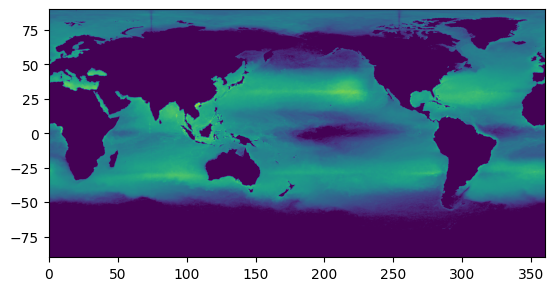

<Axes: >

In [ ]:
# Show image with heatmap of plastic pollution in the oceans
show(img)

### Plot plastic pollution data

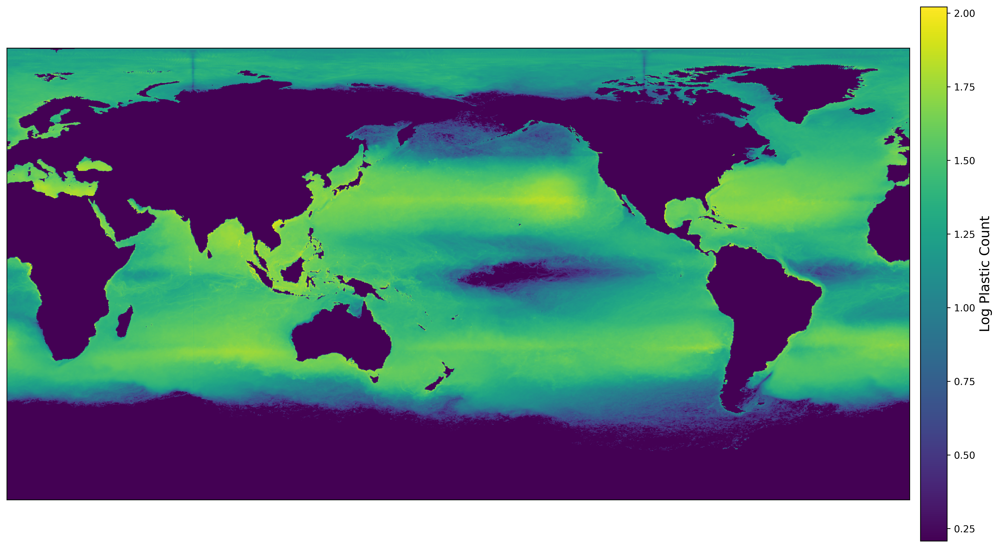

In [ ]:
# Load the plastic count data from the image
plastic_counts = img.read(1)

# Create a figure
fig, ax = plt.subplots(figsize=(20, 10), dpi=500)

# Show the original image
show(img, ax=ax)

# Create a heatmap overlay
heatmap = ax.imshow(np.log(plastic_counts + 1), cmap='viridis', alpha=1)  # You can adjust colormap and transparency as needed

# Add a colorbar to the right
cbar = plt.colorbar(heatmap, ax=ax, pad=0.01)
cbar.set_label('Log Plastic Count', fontsize=14)

# Remove x and y ticks and labels
ax.set_xticks([])
ax.set_yticks([])
ax.set_xticklabels([])
ax.set_yticklabels([])

# Save the figure
fig.savefig(path+"figures/PollutionData.png", bbox_inches='tight')


In [ ]:
# Create a list with latitude, longitude, and plastic count data
band_id = 1
band_arr = img.read(band_id)
geo_list = []

for y in range(band_arr.shape[0]):
    for x in range(band_arr.shape[1]):
      if x > 900:
        lon = x * 0.2 - 360
      else:
        lon = x * 0.2
      lat = -1 * y * 0.2 + 90
      geo_list.append({'x': x,
                      'y': y,
                      'count': band_arr[y, x],
                      'lon': lon,
                      'lat': lat
                      })

col = ["x", "y", "lon", "lat", "count"]
geo_df = pd.DataFrame(geo_list, columns=col)
geo_df

,x,y,lon,lat,count
0,0,0,0.0,90.0,0.230901
1,1,0,0.2,90.0,0.230901
2,2,0,0.4,90.0,0.230901
3,3,0,0.6,90.0,0.230901
4,4,0,0.8,90.0,0.230901
...,...,...,...,...,...
1622696,1796,900,-0.8,-90.0,0.230901
1622697,1797,900,-0.6,-90.0,0.230901
1622698,1798,900,-0.4,-90.0,0.230901
1622699,1799,900,-0.2,-90.0,0.230901


In [ ]:
# To confirm that the data has been imported correctly, I will plot a heatmap
# of plastic counts and compare to initial image.
geo_df_test = geo_df.sample(n=10000)

# Create a color scale
color_scale = px.colors.diverging.Fall

# Create a geographical scatter plot
fig = px.scatter_geo(geo_df_test,
                     lat="lat",
                     lon="lon",
                     color="count",
                     color_continuous_scale=color_scale,
                     opacity=1,
                     projection="natural earth")

fig.show()

## Download environmental variables data

In [ ]:
# Load environmental variables
# Original files were downloaded from https://doi.pangaea.de/10.1594/PANGAEA.875582

!wget {repo_url}Metatranscriptomic_environmental.tsv.gz --quiet
!gunzip Metatranscriptomic_environmental.tsv.gz --force
df_env = pd.read_csv(path+"Metatranscriptomic_environmental.tsv", sep="\t", index_col=0, skiprows = 1)
df_env

,Sample ID (BioSamples accession number (...),Sample ID (ENA sample accession number (...),Basis,Campaign,"Station (TARA_station#, registered at ...)",Method/Device,Event,Date/Time,Latitude,Longitude,...,u [cm/s] (at the sampling location and ...),v [cm/s] (at the sampling location and ...),OW (at the sampling location and ...),MLE [1/day] (at the sampling location and ...),RT [days] (of the water mass at the samp...),Latitude (of the continental shelf with...),Longitude (of the continental shelf with...),Age [days] (number of days since the samp...),Latitude (of the geographic coordinate ...),Longitude (of the geographic coordinate ...)
"Sample ID (TARA_barcode#, registered at ...)",,,,,,,,,,,,,,,,,,,,,
TARA_X000000174,SAMEA4402502,ERS1313951,SV Tara,TARA_20090905Z,TARA_001,"Plankton net, type=Bongo, mesh(µm)=300, mouth(...",TARA_20090907T1530Z_001_EVENT_NET,2009-09-07T15:30,44.4013,-9.8273,...,-3.855836,-8.864694,-0.119940,0.075851,10.972222,NaN,NaN,120.0,44.482973,-10.348751
TARA_X000000173,SAMEA4402503,ERS1313952,SV Tara,TARA_20090905Z,TARA_001,"Plankton net+sieve, type=Double, mesh(µm)=20, ...",TARA_20090907T1610Z_001_EVENT_NET,2009-09-07T16:10,44.4013,-9.8273,...,-3.855836,-8.864694,-0.119940,0.075851,10.972222,NaN,NaN,120.0,44.482973,-10.348751
TARA_X000000172,SAMEA4402504,ERS1313953,SV Tara,TARA_20090905Z,TARA_002,"Plankton net, type=Regent, mesh(µm)=680, mouth...",TARA_20090909T1830Z_002_EVENT_NET,2009-09-09T18:30,39.0564,-10.9808,...,-0.631608,-0.773749,-0.006249,0.044172,2.916667,NaN,NaN,120.0,40.591896,-10.146312
TARA_X000000171,SAMEA4402505,ERS1313954,SV Tara,TARA_20090913Z,TARA_003,"Plankton net, type=Bongo, mesh(µm)=300, mouth(...",TARA_20090913T1130Z_003_EVENT_NET,2009-09-13T11:30,36.7320,-10.4750,...,-3.196994,6.553035,-0.127186,0.062208,25.638889,NaN,NaN,120.0,NaN,NaN
TARA_X000000180,none,none,SV Tara,TARA_20090913Z,TARA_003,High Volume Peristaltic Pump,TARA_20090913T1200Z_003_EVENT_PUMP,2009-09-13T12:00,36.7320,-10.4750,...,-3.196994,6.553035,-0.127186,0.062208,25.638889,NaN,NaN,120.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TARA_B010001151,SAMEA4425728,ERS1337177,SV Tara,TARA_20131116Z,TARA_999,Continuous Surface Sampling System,TARA_20131205T1323Z_999_EVENT_CSSS,2013-12-05T13:23,48.6007,-9.0989,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TARA_G100017759,SAMEA4425729,ERS1337178,SV Tara,TARA_20131116Z,TARA_999,Continuous Surface Sampling System,TARA_20131205T1323Z_999_EVENT_CSSS,2013-12-05T13:23,48.6007,-9.0989,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TARA_R010000733,none,none,SV Tara,TARA_20131116Z,TARA_999,Continuous Surface Sampling System,TARA_20131206T0821Z_999_EVENT_CSSS,2013-12-06T08:21,48.2609,-5.1184,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Get sample ids into env df by using "sample_alias" collumn

# Create a df with all column names from Metatranscriptomic_env
columns = df_env.columns.to_list()
df = pd.DataFrame(columns = columns)

# Create a dict with the mappings of run_accession to sample_alias
Metatranscriptomic_samples_dic = {}
for index, row in Metatranscriptomic_ENA.iterrows():
  Metatranscriptomic_samples_dic[row["run_accession"]] = row["sample_alias"]

# Iterate over dict and find metadata on df
for key, value in Metatranscriptomic_samples_dic.items():
  df.loc[key] = df_env.loc[value].to_list()

df_env = df.copy()
df_env

,Sample ID (BioSamples accession number (...),Sample ID (ENA sample accession number (...),Basis,Campaign,"Station (TARA_station#, registered at ...)",Method/Device,Event,Date/Time,Latitude,Longitude,...,u [cm/s] (at the sampling location and ...),v [cm/s] (at the sampling location and ...),OW (at the sampling location and ...),MLE [1/day] (at the sampling location and ...),RT [days] (of the water mass at the samp...),Latitude (of the continental shelf with...),Longitude (of the continental shelf with...),Age [days] (number of days since the samp...),Latitude (of the geographic coordinate ...),Longitude (of the geographic coordinate ...)
ERR1001626,SAMEA2621198,ERS490542,SV Tara,TARA_20101003Z,TARA_076,High Volume Peristaltic Pump,TARA_20101016T0955Z_076_EVENT_PUMP,2010-10-16T09:55,-20.9354,-35.1803,...,0.479170,2.691546,0.084131,0.027592,0.000000,NaN,NaN,120.0,-21.599961,-34.642670
ERR1001627,SAMEA2621254,ERS490659,SV Tara,TARA_20101031Z,TARA_078,High Volume Peristaltic Pump,TARA_20101104T1015Z_078_EVENT_PUMP,2010-11-04T10:24,-30.1367,-43.2899,...,8.645021,-6.421140,0.053558,0.148190,5.777778,-41.647227,-23.741772,68.0,-24.631241,-42.963714
ERR1328122,SAMEA2623850,ERS494518,SV Tara,TARA_20120223Z,TARA_151,High Volume Peristaltic Pump,TARA_20120309T0859Z_151_EVENT_PUMP,2012-03-09T08:59,36.1715,-29.0230,...,-4.997032,3.058714,-0.157861,0.025897,37.583333,-28.188777,38.652506,76.0,36.954407,-27.865133
ERR1328123,SAMEA2620085,ERS488920,SV Tara,TARA_20100309Z,TARA_039,High Volume Peristaltic Pump,TARA_20100318T1133Z_039_EVENT_PUMP,2010-03-18T11:33,18.5839,66.4727,...,-0.557961,15.046586,0.403157,NaN,2.250000,NaN,NaN,120.0,16.583327,63.625415
ERR1328124,SAMEA2620085,ERS488920,SV Tara,TARA_20100309Z,TARA_039,High Volume Peristaltic Pump,TARA_20100318T1133Z_039_EVENT_PUMP,2010-03-18T11:33,18.5839,66.4727,...,-0.557961,15.046586,0.403157,NaN,2.250000,NaN,NaN,120.0,16.583327,63.625415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR3586746,SAMEA4398105,ERS1309554,SV Tara,TARA_20130921Z,TARA_205,High Volume Peristaltic Pump,TARA_20131008T1215Z_205_EVENT_PUMP,2013-10-08T12:15,72.4693,-71.8920,...,-1.411105,-7.393873,0.189964,0.113334,0.000000,-71.782260,71.930605,18.0,NaN,NaN
ERR3586747,SAMEA4397085,ERS1308534,SV Tara,TARA_20130519Z,TARA_163,Rosette Vertical Sampling System,TARA_20130610T0838Z_163_Combined-EVENTS_CAST,2013-06-10T08:38,76.1246,1.3648,...,4.477771,-4.544907,-0.007624,0.058176,3.277778,NaN,NaN,120.0,78.304451,0.491451
ERR3586748,SAMEA4397112,ERS1308561,SV Tara,TARA_20130629Z,TARA_168,High Volume Peristaltic Pump,TARA_20130701T0320Z_168_EVENT_PUMP,2013-07-01T03:20,72.5128,44.0775,...,2.081364,-0.467256,-0.011538,0.011037,1.222222,44.126300,72.581700,0.0,72.292098,41.906243
ERR3586749,SAMEA4397209,ERS1308658,SV Tara,TARA_20130629Z,TARA_168,Rosette Vertical Sampling System,TARA_20130702T0424Z_168_Combined-EVENTS_CAST,2013-07-02T04:24,72.5199,44.0552,...,2.081364,-0.467256,-0.011538,0.011037,1.222222,44.126300,72.581700,0.0,72.292098,41.906243


In [ ]:
# Drop columns that will not be used
df_env = df_env.drop(columns=[
                            "Sample ID (BioSamples accession number (...)",
                            "Sample ID (ENA sample accession number (...)",
                            "Basis",
                            "Campaign",
                            "Station (TARA_station#, registered at ...)",
                            "Event",
                            "Fe std dev [±] (standard deviation value at a...)",
                            "[NH4]+ std dev [±] (standard deviation value at a...)",
                            '[NO2]- std dev [±] (standard deviation value at a...)',
       'NO3 std dev [±] (standard deviation value at a...)',
       'Latitude (of the closest geographic coo...)',
       'Longitude (of the closest geographic coo...)',
       'Distance [km] (from the closest geographic c...)',
       'Latitude (of the continental shelf with...)',
       'Longitude (of the continental shelf with...)',
       'Latitude (of the geographic coordinate ...)',
       'Longitude (of the geographic coordinate ...)',
        'Depth, nominal (from which this sample was co...)',
       'Depth bot [m] (from which this sample was co...)',
       "Sample method (short label describing the ta...)",
       "Sample label (TARA_event-datetime_station#_...)",
       "Sea ice conc [%] (at the sampling location and ...)",
       "Sea ice free period start DOY [day] (at the sampling location, sea...)",
       "Sea Ice free period [days] (at the sampling location, sea...)",
       "Sea ice free period end DOY [day] (at the sampling location, sea...)",
       "Moon phase nominal (at the sampling location and ...)",
       "Moon phase proportion (at the sampling location and ...)",
       "Time of day (at the sampling location, dat...)",
       "PAR day [mol quanta/m**2/day] (at the sampling location and ...)",
       "PAR day [mol quanta/m**2/day] (at the sampling location for ...).1",
       "PAR day [mol quanta/m**2/day] (at the sampling location for ...).2",
       "SSfCDOM [ppb (QSE)] (at the sampling location and ...)",
       "NPP C [mg/m**2/day] (at the sampling location and ...)",
       "NPP C [mg/m**2/day] (at the sampling location for ...)",
       "TSS [mg/l] (at the sampling location for ...)",
       "Fraction lower [µm] (used on board to prepare samp...)",
       "Fraction upper [µm] (used on board to prepare samp...)"
       ])

df_env

,Method/Device,Date/Time,Latitude,Longitude,"Env feature ([abbreviation], full name (EN...)",Depth top [m] (from which this sample was co...),Sample material (TARA_station#_environmental-f...),MP biome (Longhurst (2007)),OS region ([abbreviation] full name (MRG...),BG province ([abbreviation] full name (MRG...),...,PIC [mol/m**3] (at the sampling location for ...),Bathy depth [m] (at the sampling location and ...),SST grad h [°C/100 km] (at the sampling location and ...),SSM index [1/s**2] (at the sampling location and ...),u [cm/s] (at the sampling location and ...),v [cm/s] (at the sampling location and ...),OW (at the sampling location and ...),MLE [1/day] (at the sampling location and ...),RT [days] (of the water mass at the samp...),Age [days] (number of days since the samp...)
ERR1001626,High Volume Peristaltic Pump,2010-10-16T09:55,-20.9354,-35.1803,[SRF] surface water layer (ENVO:00010504),3.0,TARA_076_SRF_0.22-3,Trades Biome,[SAO] South Atlantic Ocean (MRGID:1914),[SATL] South Atlantic Gyral Province (MRGID:21...,...,0.000093,-3847.0,0.59536,1.200000e-07,0.479170,2.691546,0.084131,0.027592,0.000000,120.0
ERR1001627,High Volume Peristaltic Pump,2010-11-04T10:24,-30.1367,-43.2899,[SRF] surface water layer (ENVO:00010504),3.0,TARA_078_SRF_0.22-3,Trades Biome,[SAO] South Atlantic Ocean (MRGID:1914),[SATL] South Atlantic Gyral Province (MRGID:21...,...,0.000205,-3887.0,3.76480,1.578700e-05,8.645021,-6.421140,0.053558,0.148190,5.777778,68.0
ERR1328122,High Volume Peristaltic Pump,2012-03-09T08:59,36.1715,-29.0230,[SRF] surface water layer (ENVO:00010504),3.0,TARA_151_SRF_0.22-3,Westerlies Biome,[NAO] North Atlantic Ocean (MRGID:1912),[NAST-E] North Atlantic Subtropical Gyral Prov...,...,0.000111,-3478.0,1.56620,1.058100e-05,-4.997032,3.058714,-0.157861,0.025897,37.583333,76.0
ERR1328123,High Volume Peristaltic Pump,2010-03-18T11:33,18.5839,66.4727,[DCM] deep chlorophyll maximum layer (ENVO:010...,23.0,TARA_039_DCM_0.22-1.6,Trades Biome,[IO] Indian Ocean (MRGID:1904),[MONS] Indian Monsoon Gyres Province (MRGID:21...,...,0.000229,-3265.0,0.28957,9.598900e-05,-0.557961,15.046586,0.403157,NaN,2.250000,120.0
ERR1328124,High Volume Peristaltic Pump,2010-03-18T11:33,18.5839,66.4727,[DCM] deep chlorophyll maximum layer (ENVO:010...,23.0,TARA_039_DCM_0.22-1.6,Trades Biome,[IO] Indian Ocean (MRGID:1904),[MONS] Indian Monsoon Gyres Province (MRGID:21...,...,0.000229,-3265.0,0.28957,9.598900e-05,-0.557961,15.046586,0.403157,NaN,2.250000,120.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR3586746,High Volume Peristaltic Pump,2013-10-08T12:15,72.4693,-71.8920,[SRF] surface water layer (ENVO:00010504),3.0,TARA_205_SRF_0.22-3,Polar Biome,[AO] Arctic Ocean (MRGID:1906),[BPLR] Boreal Polar Province (MRGID:21450),...,NaN,-1053.0,NaN,NaN,-1.411105,-7.393873,0.189964,0.113334,0.000000,18.0
ERR3586747,Rosette Vertical Sampling System,2013-06-10T08:38,76.1246,1.3648,[MES] marine water layer (ENVO:01000295) withi...,490.0,TARA_163_MES_0.22-3,Polar Biome,[AO] Arctic Ocean (MRGID:1906),[BPLR] Boreal Polar Province (MRGID:21450),...,0.000422,-2937.0,1.10580,5.874300e-05,4.477771,-4.544907,-0.007624,0.058176,3.277778,120.0
ERR3586748,High Volume Peristaltic Pump,2013-07-01T03:20,72.5128,44.0775,[SRF] surface water layer (ENVO:00010504),3.0,TARA_168_SRF_0.22-3,Polar Biome,[AO] Arctic Ocean (MRGID:1906),[BPLR] Boreal Polar Province (MRGID:21450),...,0.000580,-267.0,0.45599,8.042000e-06,2.081364,-0.467256,-0.011538,0.011037,1.222222,0.0
ERR3586749,Rosette Vertical Sampling System,2013-07-02T04:24,72.5199,44.0552,[MIX] marine epipelagic wind mixed layer (ENVO...,10.0,TARA_168_MIX_0.22-3,Polar Biome,[AO] Arctic Ocean (MRGID:1906),[BPLR] Boreal Polar Province (MRGID:21450),...,0.000579,-266.0,1.45380,1.614000e-06,2.081364,-0.467256,-0.011538,0.011037,1.222222,0.0


In [ ]:
# Modify Date/Time column to only keep years
def modify_s(s):
  return s.split("-")[0]
df_env["Date/Time"] = df_env["Date/Time"].apply(modify_s)

In [ ]:
# Modify Env feature column to only keep abbreviation
def modify_s(s):
  return s.split("[")[1].split("]")[0]
df_env["Env feature ([abbreviation], full name (EN...)"] = df_env["Env feature ([abbreviation], full name (EN...)"].apply(modify_s)

In [ ]:
# Modify Date/Time column to only keep years
def modify_s(s):
  return s.split("_")[3]
df_env["Sample material (TARA_station#_environmental-f...)"] = df_env["Sample material (TARA_station#_environmental-f...)"].apply(modify_s)

In [ ]:
# Modify OS region
def modify_s(s):
  return s.split("] ")[1].split(" (")[0]
df_env["OS region ([abbreviation] full name (MRG...)"] = df_env["OS region ([abbreviation] full name (MRG...)"].apply(modify_s)

In [ ]:
# Modify OS province
def modify_s(s):
  return s.split("] ")[1].split(" (")[0]
df_env["BG province ([abbreviation] full name (MRG...)"] = df_env["BG province ([abbreviation] full name (MRG...)"].apply(modify_s)

In [ ]:
# Rename all columns
df_env = df_env.rename(columns = {
    'Method/Device': "Device",
    'Date/Time': "Year",
    'Env feature ([abbreviation], full name (EN...)': "Feature",
       'Depth top [m] (from which this sample was co...)': "Depth top",
       'Sample material (TARA_station#_environmental-f...)': "Sample material",
       'MP biome (Longhurst (2007))': "Biome",
       'OS region ([abbreviation] full name (MRG...)': "Region",
       'BG province ([abbreviation] full name (MRG...)': "Province",
       'Season (at the sampling location and ...)': "Season",
       'Season (at the sampling location and ...).1': "Season period",
       'SSD [min] (at the sampling location and ...)': "SSD",
       'PAR day [mol quanta/m**2/day] (at the sampling location for ...)': "PAR",
       'SST grad h [°C/100 km] (at the sampling location for ...)': "SST",
       'Fe tot [µmol/l] (mean value at a depth of 5 m ...)': "Fe",
       '[NH4]+ [µmol/l] (mean value at a depth of 5 m ...)': "NH4",
       '[NO2]- [µmol/l] (mean value at a depth of 5 m ...)': "NO2",
       '[NO3]- [µmol/l] (mean value at a depth of 5 m ...)': "NO3",
       'SSChla [mg/m**3] (at the sampling location for ...)': "SSChla",
       'Chl a conc [mg/m**2] (at the sampling location and ...)': "Chl",
       'Ssphi sat [%] (at the sampling location for ...)': "Ssphi",
       'POC [µg/kg] (at the sampling location for ...)': "POC",
       'PIC [mol/m**3] (at the sampling location for ...)': "PIC",
       'Bathy depth [m] (at the sampling location and ...)': "Bathy depth",
       'SST grad h [°C/100 km] (at the sampling location and ...)': "SST",
       'SSM index [1/s**2] (at the sampling location and ...)': "SSM",
       'u [cm/s] (at the sampling location and ...)': "u",
       'v [cm/s] (at the sampling location and ...)': "v",
       'OW (at the sampling location and ...)': "OW",
       'MLE [1/day] (at the sampling location and ...)': "MLE",
       'RT [days] (of the water mass at the samp...)': "RT",
       'Age [days] (number of days since the samp...)': "Age",
    })


In [ ]:
df_env

,Device,Year,Latitude,Longitude,Feature,Depth top,Sample material,Biome,Region,Province,...,PIC,Bathy depth,SST,SSM,u,v,OW,MLE,RT,Age
ERR1001626,High Volume Peristaltic Pump,2010,-20.9354,-35.1803,SRF,3.0,0.22-3,Trades Biome,South Atlantic Ocean,South Atlantic Gyral Province,...,0.000093,-3847.0,0.59536,1.200000e-07,0.479170,2.691546,0.084131,0.027592,0.000000,120.0
ERR1001627,High Volume Peristaltic Pump,2010,-30.1367,-43.2899,SRF,3.0,0.22-3,Trades Biome,South Atlantic Ocean,South Atlantic Gyral Province,...,0.000205,-3887.0,3.76480,1.578700e-05,8.645021,-6.421140,0.053558,0.148190,5.777778,68.0
ERR1328122,High Volume Peristaltic Pump,2012,36.1715,-29.0230,SRF,3.0,0.22-3,Westerlies Biome,North Atlantic Ocean,North Atlantic Subtropical Gyral Province,...,0.000111,-3478.0,1.56620,1.058100e-05,-4.997032,3.058714,-0.157861,0.025897,37.583333,76.0
ERR1328123,High Volume Peristaltic Pump,2010,18.5839,66.4727,DCM,23.0,0.22-1.6,Trades Biome,Indian Ocean,Indian Monsoon Gyres Province,...,0.000229,-3265.0,0.28957,9.598900e-05,-0.557961,15.046586,0.403157,NaN,2.250000,120.0
ERR1328124,High Volume Peristaltic Pump,2010,18.5839,66.4727,DCM,23.0,0.22-1.6,Trades Biome,Indian Ocean,Indian Monsoon Gyres Province,...,0.000229,-3265.0,0.28957,9.598900e-05,-0.557961,15.046586,0.403157,NaN,2.250000,120.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR3586746,High Volume Peristaltic Pump,2013,72.4693,-71.8920,SRF,3.0,0.22-3,Polar Biome,Arctic Ocean,Boreal Polar Province,...,NaN,-1053.0,NaN,NaN,-1.411105,-7.393873,0.189964,0.113334,0.000000,18.0
ERR3586747,Rosette Vertical Sampling System,2013,76.1246,1.3648,MES,490.0,0.22-3,Polar Biome,Arctic Ocean,Boreal Polar Province,...,0.000422,-2937.0,1.10580,5.874300e-05,4.477771,-4.544907,-0.007624,0.058176,3.277778,120.0
ERR3586748,High Volume Peristaltic Pump,2013,72.5128,44.0775,SRF,3.0,0.22-3,Polar Biome,Arctic Ocean,Boreal Polar Province,...,0.000580,-267.0,0.45599,8.042000e-06,2.081364,-0.467256,-0.011538,0.011037,1.222222,0.0
ERR3586749,Rosette Vertical Sampling System,2013,72.5199,44.0552,MIX,10.0,0.22-3,Polar Biome,Arctic Ocean,Boreal Polar Province,...,0.000579,-266.0,1.45380,1.614000e-06,2.081364,-0.467256,-0.011538,0.011037,1.222222,0.0


In [ ]:
def get_count(df=geo_df, lat=10, lon=10):

  df["tmp_lat"] = lat
  df["tmp_lon"] = lon
  df["sum_lat"] = df["tmp_lat"] - df["lat"]
  df["sum_lat"] = df["sum_lat"].abs()
  df["sum_lon"] = df["tmp_lon"] - df["lon"]
  df["sum_lon"] = df["sum_lon"].abs()
  df["sum"] = df["sum_lon"] + df["sum_lat"]
  df = df.sort_values("sum", ascending=True)
  df = df.iloc[0:1]
  data = {"count": df["count"].iat[0], "lat": df["lat"].iat[0], "lon": df["lon"].iat[0], "sum": df["sum"].iat[0]}
  return data


df_env["Lat_plastic"] = None
df_env["Lon_plastic"] = None
df_env["Plastic_count"] = None

for index, row in df_env.iterrows():
  lon = row["Longitude"]
  lat = row["Latitude"]
  data = get_count(geo_df, lat, lon)
  df_env.at[index, "Lat_plastic"] = data["lat"]
  df_env.at[index, "Lon_plastic"] = data["lon"]
  df_env.at[index, "Plastic_count"] = data["count"]

df_env

,Device,Year,Latitude,Longitude,Feature,Depth top,Sample material,Biome,Region,Province,...,SSM,u,v,OW,MLE,RT,Age,Lat_plastic,Lon_plastic,Plastic_count
ERR1001626,High Volume Peristaltic Pump,2010,-20.9354,-35.1803,SRF,3.0,0.22-3,Trades Biome,South Atlantic Ocean,South Atlantic Gyral Province,...,1.200000e-07,0.479170,2.691546,0.084131,0.027592,0.000000,120.0,-21.0,-35.2,3.449604
ERR1001627,High Volume Peristaltic Pump,2010,-30.1367,-43.2899,SRF,3.0,0.22-3,Trades Biome,South Atlantic Ocean,South Atlantic Gyral Province,...,1.578700e-05,8.645021,-6.421140,0.053558,0.148190,5.777778,68.0,-30.2,-43.2,2.993198
ERR1328122,High Volume Peristaltic Pump,2012,36.1715,-29.0230,SRF,3.0,0.22-3,Westerlies Biome,North Atlantic Ocean,North Atlantic Subtropical Gyral Province,...,1.058100e-05,-4.997032,3.058714,-0.157861,0.025897,37.583333,76.0,36.2,-29.0,3.89675
ERR1328123,High Volume Peristaltic Pump,2010,18.5839,66.4727,DCM,23.0,0.22-1.6,Trades Biome,Indian Ocean,Indian Monsoon Gyres Province,...,9.598900e-05,-0.557961,15.046586,0.403157,NaN,2.250000,120.0,18.6,66.4,4.027151
ERR1328124,High Volume Peristaltic Pump,2010,18.5839,66.4727,DCM,23.0,0.22-1.6,Trades Biome,Indian Ocean,Indian Monsoon Gyres Province,...,9.598900e-05,-0.557961,15.046586,0.403157,NaN,2.250000,120.0,18.6,66.4,4.027151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR3586746,High Volume Peristaltic Pump,2013,72.4693,-71.8920,SRF,3.0,0.22-3,Polar Biome,Arctic Ocean,Boreal Polar Province,...,NaN,-1.411105,-7.393873,0.189964,0.113334,0.000000,18.0,72.4,-71.8,2.633322
ERR3586747,Rosette Vertical Sampling System,2013,76.1246,1.3648,MES,490.0,0.22-3,Polar Biome,Arctic Ocean,Boreal Polar Province,...,5.874300e-05,4.477771,-4.544907,-0.007624,0.058176,3.277778,120.0,76.2,1.4,3.074806
ERR3586748,High Volume Peristaltic Pump,2013,72.5128,44.0775,SRF,3.0,0.22-3,Polar Biome,Arctic Ocean,Boreal Polar Province,...,8.042000e-06,2.081364,-0.467256,-0.011538,0.011037,1.222222,0.0,72.6,44.0,2.985266
ERR3586749,Rosette Vertical Sampling System,2013,72.5199,44.0552,MIX,10.0,0.22-3,Polar Biome,Arctic Ocean,Boreal Polar Province,...,1.614000e-06,2.081364,-0.467256,-0.011538,0.011037,1.222222,0.0,72.6,44.0,2.985266


In [ ]:
# Save environmental variables to files
columns = df_env.columns
Metatranscriptomic_env = pd.DataFrame(columns = columns)
for key, value in Metatranscriptomic_samples_dic.items():
  Metatranscriptomic_env.loc[key] = df_env.loc[key].to_list()

Metatranscriptomic_env = Metatranscriptomic_env.sort_index()
Metatranscriptomic_env.to_csv(path+"Metatranscriptomic_env.tsv", sep = "\t")

Metatranscriptomic_env

,Device,Year,Latitude,Longitude,Feature,Depth top,Sample material,Biome,Region,Province,...,SSM,u,v,OW,MLE,RT,Age,Lat_plastic,Lon_plastic,Plastic_count
ERR1001626,High Volume Peristaltic Pump,2010,-20.9354,-35.1803,SRF,3.0,0.22-3,Trades Biome,South Atlantic Ocean,South Atlantic Gyral Province,...,1.200000e-07,0.479170,2.691546,0.084131,0.027592,0.000000,120.0,-21.0,-35.2,3.449604
ERR1001627,High Volume Peristaltic Pump,2010,-30.1367,-43.2899,SRF,3.0,0.22-3,Trades Biome,South Atlantic Ocean,South Atlantic Gyral Province,...,1.578700e-05,8.645021,-6.421140,0.053558,0.148190,5.777778,68.0,-30.2,-43.2,2.993198
ERR1328122,High Volume Peristaltic Pump,2012,36.1715,-29.0230,SRF,3.0,0.22-3,Westerlies Biome,North Atlantic Ocean,North Atlantic Subtropical Gyral Province,...,1.058100e-05,-4.997032,3.058714,-0.157861,0.025897,37.583333,76.0,36.2,-29.0,3.896750
ERR1328123,High Volume Peristaltic Pump,2010,18.5839,66.4727,DCM,23.0,0.22-1.6,Trades Biome,Indian Ocean,Indian Monsoon Gyres Province,...,9.598900e-05,-0.557961,15.046586,0.403157,NaN,2.250000,120.0,18.6,66.4,4.027151
ERR1328124,High Volume Peristaltic Pump,2010,18.5839,66.4727,DCM,23.0,0.22-1.6,Trades Biome,Indian Ocean,Indian Monsoon Gyres Province,...,9.598900e-05,-0.557961,15.046586,0.403157,NaN,2.250000,120.0,18.6,66.4,4.027151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR3587200,High Volume Peristaltic Pump,2011,-8.9111,-142.5571,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,"South Pacific Subtropical Gyre Province, North...",...,8.210000e-07,1.059620,-2.544526,-0.004254,0.014455,0.000000,120.0,-9.0,-142.6,1.676520
ERR3587201,High Volume Peristaltic Pump,2011,-8.9971,-139.1963,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,"South Pacific Subtropical Gyre Province, North...",...,4.056000e-06,-13.524453,5.403076,0.007751,0.028977,15.833333,120.0,-9.0,-139.2,1.903081
ERR3587202,High Volume Peristaltic Pump,2011,-8.9068,-140.2830,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,"South Pacific Subtropical Gyre Province, North...",...,1.077000e-06,-4.286042,2.890793,-0.011503,0.053774,1.083333,120.0,-9.0,-140.2,1.567905
ERR3587203,High Volume Peristaltic Pump,2011,-9.1504,-140.5216,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,"South Pacific Subtropical Gyre Province, North...",...,2.460000e-06,-2.752385,-2.994587,0.000096,0.043603,2.777778,37.0,-9.2,-140.6,1.841432


## Download PlasticDB database

In [ ]:
# Download sequences of proteins reported to degrade plastics from PlasticDB
# For the updated version
# !wget https://plasticdb.org/static/PlasticDB.fasta -O {path+"databases/PlasticDB/PlasticDB.fasta"}

# For the version used in this study
!wget {repo_url}PlasticDB.fasta -O {path}databases/PlasticDB/PlasticDB.fasta --quiet

In [ ]:
# Create diamond database from PlasticDB fasta file
!{path+"tools/"}diamond makedb --in {path+"databases/PlasticDB/PlasticDB.fasta"} --db {path+"databases/PlasticDB/PlasticDB"}

In [ ]:
# Create a list with all plastics present in the PlsticDB fasta file
with open(path+"databases/PlasticDB/PlasticDB.fasta") as f:
  f = f.readlines()
  PlasticDB_plastics = []
  PlasticDB_count = {}
  for line in f:
    if line.startswith(">"):
      for plastic in line.split("||")[3].rstrip().split("_"):
        if plastic not in PlasticDB_plastics:
          PlasticDB_plastics.append(plastic)
        if plastic not in PlasticDB_count:
          PlasticDB_count[plastic] = 1
        else:
          PlasticDB_count[plastic] += 1

print(len(PlasticDB_plastics))
print(PlasticDB_plastics)
print(PlasticDB_count)

33
['PHB', 'PHA', 'PHO', 'PCL', 'PVA', 'PU', 'PPL', 'P3HP', 'P4HB', 'PEA', 'PES', 'O-PVA', 'PBS', 'PLA', 'P(3HB-co-3MP)', 'PEG', 'PHBV', 'PHPV', 'Nylon', 'PBSA', 'PET', 'PE', 'PBS-Blend', 'PBSA-Blend', 'P3HV', 'PBAT', 'PEF', 'PMCL', 'LDPE', 'PS', 'NR', 'PBSU', 'PESU']
{'PHB': 45, 'PHA': 53, 'PHO': 1, 'PCL': 36, 'PVA': 3, 'PU': 16, 'PPL': 1, 'P3HP': 3, 'P4HB': 3, 'PEA': 3, 'PES': 9, 'O-PVA': 2, 'PBS': 11, 'PLA': 25, 'P(3HB-co-3MP)': 1, 'PEG': 2, 'PHBV': 4, 'PHPV': 1, 'Nylon': 10, 'PBSA': 15, 'PET': 52, 'PE': 1, 'PBS-Blend': 1, 'PBSA-Blend': 1, 'P3HV': 1, 'PBAT': 14, 'PEF': 2, 'PMCL': 1, 'LDPE': 2, 'PS': 1, 'NR': 4, 'PBSU': 1, 'PESU': 1}


### Plot number of enzymes for each plastic in PlasticDB

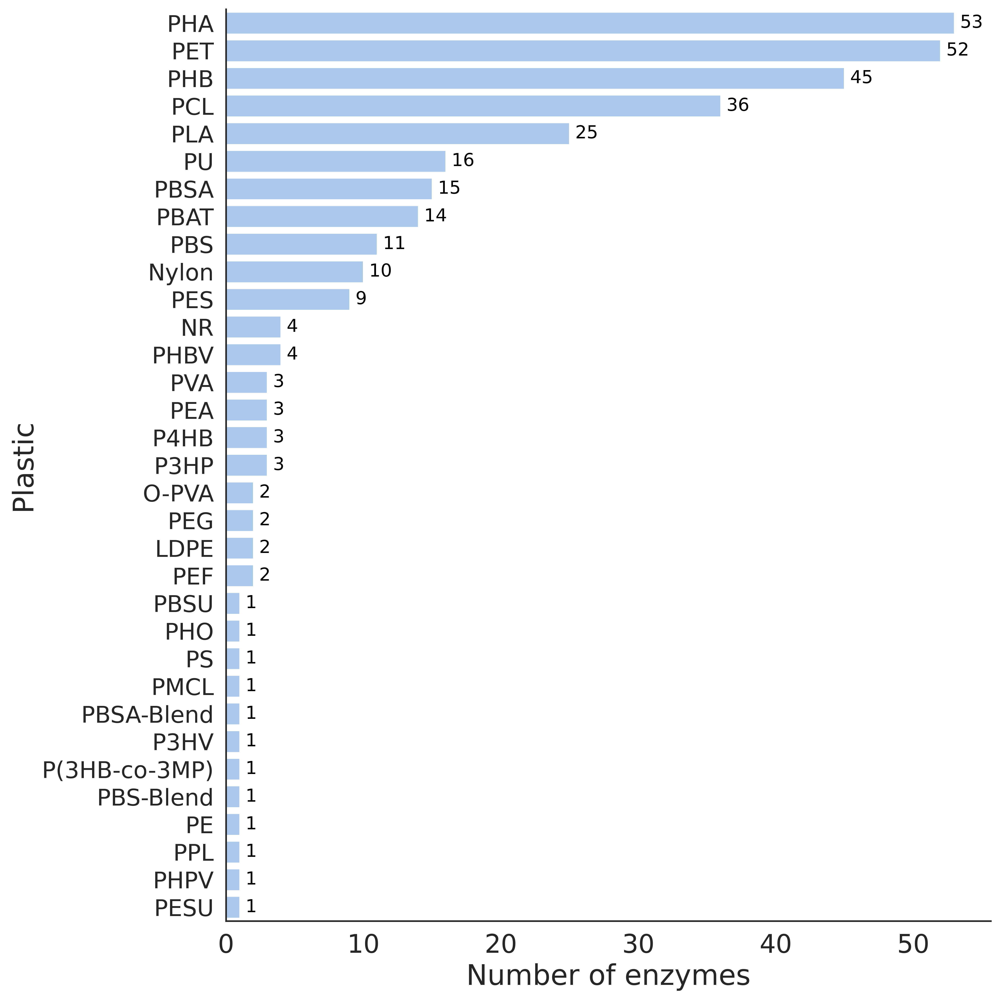

In [ ]:
# Get a pastel color palette
palette = sns.color_palette("pastel")

# Create a DataFrame from the dictionary
df_tmp = pd.DataFrame.from_dict(PlasticDB_count, orient='index', columns=["Number of enzymes"]).sort_values("Number of enzymes", ascending=False)

# Create a bar plot
fig, ax = plt.subplots(figsize=(11, 11), dpi=500)
ax = sns.barplot(y=df_tmp.index, x="Number of enzymes", data=df_tmp, color=palette[0])

# Add y-axis label
ax.set_ylabel("Plastic")

# Remove top and right borders
sns.despine()

# Set font sizes
sns.set(rc={'axes.labelsize': 22, 'xtick.labelsize': 20, 'ytick.labelsize': 18})
# Set white style
sns.set_style('white')

# Add annotations with numbers
for index, value in enumerate(df_tmp["Number of enzymes"]):
    ax.text(value, index, f' {value}', ha='left', va='center', fontsize=14, color='black')

# Save the plot
plt.tight_layout()
plt.savefig(path+"figures/PlasticDBEnzymesPerPlastic.png", dpi=500)

# Metatranscriptomic data analysis

## Diamond alignment

In [ ]:
# Use diamond to align sequences to PlasticDB database
base_count_mean = Metatranscriptomic_ENA.base_count.mean()
base_count_max = Metatranscriptomic_ENA.base_count.max()
for index, row in Metatranscriptomic_ENA.iloc[100:].iterrows():
    url1, url2 = row["fastq_ftp"].split(";")
    r1 = url1.split("/")[-1]
    r2 = url2.split("/")[-1]
    sample = r1.split("/")[-1].split("_")[0]
    db_path = path2+"databases/PlasticDB/PlasticDB"
    base_count = row["base_count"]
    #Sending Diamond jobs
    if base_count > base_count_max*0.8:
        job_time = "00:25:00"
    elif base_count > base_count_mean:
        job_time = "00:20:00"
    else:
        job_time = "00:15:00"
    job_memory = "8GB"
    job_cpus = 8
    # Read 1
    job_name = sample[-5:]+"_1"
    job_command = path2+"tools/"+"diamond blastx -q "+path+"metatranscriptomic_data/"+r1+" -d "+db_path+" -o "+path2+"metatranscriptomic_data/"+r1+".tsv -f 6 --threads 8 --memory-limit 6 --quiet --header"
    run_command(run_on_slurm, account, job_name, job_time, job_memory, job_cpus, job_command)
    time.sleep(1)
    # Read 2
    job_name = sample[-5:]+"_2"
    job_command = path2+"tools/"+"diamond blastx -q "+path+"metatranscriptomic_data/"+r2+" -d "+db_path+" -o "+path2+"metatranscriptomic_data/"+r2+".tsv -f 6 --threads 8 --memory-limit 6 --quiet --header"
    run_command(run_on_slurm, account, job_name, job_time, job_memory, job_cpus, job_command)
    time.sleep(1)

In [ ]:
# Redo jobs that ran out of time
base_count_mean = Metatranscriptomic_ENA.base_count.mean()
base_count_max = Metatranscriptomic_ENA.base_count.max()
for index, row in Metatranscriptomic_ENA.iloc[50:].iterrows():
    url1, url2 = row["fastq_ftp"].split(";")
    r1 = url1.split("/")[-1]
    r2 = url2.split("/")[-1]
    sample = r1.split("/")[-1].split("_")[0]
    db_path = path2+"databases/PlasticDB/PlasticDB"
    base_count = row["base_count"]
    job_memory = "8GB"
    job_cpus = 8
    #Sending Diamond jobs
    # Read 1
    if os.path.getsize(path2+"metatranscriptomic_data/"+r1+".tsv") == 0:
        job_time = "00:45:00"
        job_name = sample[-5:]+"_1"
        job_command = path2+"tools/"+"diamond blastx -q "+path+"metatranscriptomic_data/"+r1+" -d "+db_path+" -o "+path2+"metatranscriptomic_data/"+r1+".tsv -f 6 --threads 8 --memory-limit 6 --quiet --header"
        run_command(run_on_slurm, account, job_name, job_time, job_memory, job_cpus, job_command)
        time.sleep(1)
    # Read 2
    if os.path.getsize(path2+"metatranscriptomic_data/"+r2+".tsv") == 0:
        job_time = "00:45:00"
        job_name = sample[-5:]+"_2"
        job_command = path2+"tools/"+"diamond blastx -q "+path+"metatranscriptomic_data/"+r2+" -d "+db_path+" -o "+path2+"metatranscriptomic_data/"+r2+".tsv -f 6 --threads 8 --memory-limit 6 --quiet --header"
        run_command(run_on_slurm, account, job_name, job_time, job_memory, job_cpus, job_command)
        time.sleep(1)

### Parse DIAMOND results per plastic

In [ ]:
# Parse diamond results
Metatranscriptomic_diamond_raw_counts = pd.DataFrame(data=None, columns=PlasticDB_plastics)
for index, row in Metatranscriptomic_ENA.iterrows():
  url1, url2 = row["fastq_ftp"].split(";")
  r1 = path+"metatranscriptomic_data/"+url1.split("/")[-1]+".tsv"
  r2 = path+"metatranscriptomic_data/"+url2.split("/")[-1]+".tsv"
  sample = r1.split("/")[-1].split("_")[0]
  df = parse_diamond(sample, r1, r2, 1e-10, 30, PlasticDB_plastics)
  Metatranscriptomic_diamond_raw_counts = pd.concat([Metatranscriptomic_diamond_raw_counts, df])

Metatranscriptomic_diamond_raw_counts = Metatranscriptomic_diamond_raw_counts.sort_index()
Metatranscriptomic_diamond_raw_counts.to_csv(path+"Metatranscriptomic_diamond_raw_counts.tsv", sep = "\t")
Metatranscriptomic_diamond_raw_counts

,PHB,PHA,PHO,PCL,PVA,PU,PPL,P3HP,P4HB,PEA,...,PE,PBS-Blend,PBSA-Blend,P3HV,PBAT,PEF,PMCL,LDPE,PS,NR
ERR1001626,396,725,0,194,2,76,1,3,3,3,...,12,0,0,154,181,0,0,108,166,4
ERR1001627,51,74,0,25,1,67,0,0,0,0,...,1,0,0,17,91,0,0,25,55,0
ERR1328122,85,119,0,62,2,90,0,0,0,0,...,2,0,0,16,106,0,0,14,0,5
ERR1328123,254,345,0,159,0,282,0,0,0,0,...,0,0,0,50,639,0,0,48,0,1
ERR1328124,87,104,0,47,0,88,0,0,0,0,...,0,0,0,10,196,0,0,10,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR3586746,7,43,0,109,0,127,0,0,0,0,...,1,0,0,11,132,0,0,33,6,26
ERR3586747,47,97,0,56,6,55,0,0,0,0,...,14,0,0,46,128,4,0,16,113,0
ERR3586748,3,4,0,59,0,57,0,0,0,0,...,0,0,0,1,40,0,0,17,15,4
ERR3586749,10,18,1,39,0,41,0,0,0,0,...,0,0,0,2,68,0,0,5,28,3


In [ ]:
# Ddownload if necessary
Metatranscriptomic_diamond_raw_counts = pd.read_csv(repo_url+"Metatranscriptomic_diamond_raw_counts.tsv", sep = "\t", index_col=0)
Metatranscriptomic_diamond_raw_counts

,PHB,PHA,PHO,PCL,PVA,PU,PPL,P3HP,P4HB,PEA,...,PE,PBS-Blend,PBSA-Blend,P3HV,PBAT,PEF,PMCL,LDPE,PS,NR
ERR1001626,396,725,0,194,2,76,1,3,3,3,...,12,0,0,154,181,0,0,108,166,4
ERR1001627,51,74,0,25,1,67,0,0,0,0,...,1,0,0,17,91,0,0,25,55,0
ERR1328122,85,119,0,62,2,90,0,0,0,0,...,2,0,0,16,106,0,0,14,0,5
ERR1328123,254,345,0,159,0,282,0,0,0,0,...,0,0,0,50,639,0,0,48,0,1
ERR1328124,87,104,0,47,0,88,0,0,0,0,...,0,0,0,10,196,0,0,10,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR3587200,321,366,0,120,5,229,0,2,2,2,...,85,0,0,40,422,10,0,88,1,2
ERR3587201,60,67,0,7,2,54,0,2,2,2,...,3,0,0,6,103,0,0,11,2,6
ERR3587202,21,26,0,12,0,40,0,0,0,0,...,8,0,0,5,30,0,0,5,0,4
ERR3587203,27,36,0,24,0,49,0,0,0,0,...,4,0,0,5,54,1,0,13,0,7


In [ ]:
# Normalize count table by dividing by library size and calculating log10
rows = []
indexes = []
for index, row in Metatranscriptomic_diamond_raw_counts.iterrows():
  base_count = Metatranscriptomic_ENA.loc[Metatranscriptomic_ENA['run_accession'] == index]["base_count"].iloc[0]
  normalized_row = np.log10(row.div(base_count / 1000000000000))
  rows.append(normalized_row.to_dict())
  indexes.append(index)

# Crate df
Metatranscriptomic_diamond_norm_counts = pd.DataFrame(rows, index=indexes)

# Replace -inf with a specific value (e.g., 0)
Metatranscriptomic_diamond_norm_counts[~np.isfinite(Metatranscriptomic_diamond_norm_counts)] = 0

# Display df
Metatranscriptomic_diamond_norm_counts

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning:

divide by zero encountered in log10



,PHB,PHA,PHO,PCL,PVA,PU,PPL,P3HP,P4HB,PEA,...,PE,PBS-Blend,PBSA-Blend,P3HV,PBAT,PEF,PMCL,LDPE,PS,NR
ERR1001626,4.865257,5.127900,0.0,4.555364,2.568592,4.148376,2.267562,2.744684,2.744684,2.744684,...,3.346744,0.0,0.0,4.455083,4.525241,0.000000,0.0,4.300986,4.487670,2.869622
ERR1001627,4.089129,4.250790,0.0,3.779499,2.381559,4.207633,0.000000,0.000000,0.000000,0.000000,...,2.381559,0.0,0.0,3.612007,4.340600,0.000000,0.0,3.779499,4.121921,0.000000
ERR1328122,4.174066,4.320194,0.0,4.037039,2.545677,4.198889,0.000000,0.000000,0.000000,0.000000,...,2.545677,0.0,0.0,3.448767,4.269953,0.000000,0.0,3.390775,0.000000,2.943617
ERR1328123,3.926754,4.059740,0.0,3.723318,0.000000,3.972170,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,3.220891,4.327421,0.000000,0.0,3.203162,0.000000,1.521921
ERR1328124,4.005051,4.082565,0.0,3.737630,0.000000,4.010014,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,3.065532,4.357788,0.000000,0.0,3.065532,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR3587200,4.134872,4.191848,0.0,3.707548,2.327337,3.988202,0.000000,1.929397,1.929397,1.929397,...,3.557786,0.0,0.0,3.230427,4.253679,2.628367,0.0,3.572850,1.628367,1.929397
ERR3587201,4.139973,4.187896,0.0,3.206920,2.662851,4.094215,0.000000,2.662851,2.662851,2.662851,...,2.838943,0.0,0.0,3.139973,4.374659,0.000000,0.0,3.403214,2.662851,3.139973
ERR3587202,3.796136,3.888890,0.0,3.553098,0.000000,4.075977,0.000000,0.000000,0.000000,0.000000,...,3.377007,0.0,0.0,3.172887,3.951038,0.000000,0.0,3.172887,0.000000,3.075977
ERR3587203,3.821643,3.946582,0.0,3.770491,0.000000,4.080475,0.000000,0.000000,0.000000,0.000000,...,2.992339,0.0,0.0,3.089249,4.122673,2.390279,0.0,3.504223,0.000000,3.235377


In [ ]:
Metatranscriptomic_diamond_norm_counts = Metatranscriptomic_diamond_norm_counts.sort_index()
Metatranscriptomic_diamond_norm_counts.to_csv(path+"Metatranscriptomic_diamond_norm_counts.tsv", sep = "\t")

In [ ]:
# Ddownload if necessary
Metatranscriptomic_diamond_norm_counts = pd.read_csv(repo_url+"Metatranscriptomic_diamond_norm_counts.tsv", sep = "\t", index_col=0)
Metatranscriptomic_diamond_norm_counts

,PHB,PHA,PHO,PCL,PVA,PU,PPL,P3HP,P4HB,PEA,...,PE,PBS-Blend,PBSA-Blend,P3HV,PBAT,PEF,PMCL,LDPE,PS,NR
ERR1001626,4.865257,5.127900,0.0,4.555364,2.568592,4.148376,2.267562,2.744684,2.744684,2.744684,...,3.346744,0.0,0.0,4.455083,4.525241,0.000000,0.0,4.300986,4.487670,2.869622
ERR1001627,4.089129,4.250790,0.0,3.779499,2.381559,4.207633,0.000000,0.000000,0.000000,0.000000,...,2.381559,0.0,0.0,3.612007,4.340600,0.000000,0.0,3.779499,4.121921,0.000000
ERR1328122,4.174066,4.320194,0.0,4.037039,2.545677,4.198889,0.000000,0.000000,0.000000,0.000000,...,2.545677,0.0,0.0,3.448767,4.269953,0.000000,0.0,3.390775,0.000000,2.943617
ERR1328123,3.926754,4.059740,0.0,3.723318,0.000000,3.972170,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,3.220891,4.327421,0.000000,0.0,3.203162,0.000000,1.521921
ERR1328124,4.005051,4.082565,0.0,3.737630,0.000000,4.010014,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,3.065532,4.357788,0.000000,0.0,3.065532,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR3587200,4.134872,4.191848,0.0,3.707548,2.327337,3.988202,0.000000,1.929397,1.929397,1.929397,...,3.557786,0.0,0.0,3.230427,4.253679,2.628367,0.0,3.572850,1.628367,1.929397
ERR3587201,4.139973,4.187896,0.0,3.206920,2.662851,4.094215,0.000000,2.662851,2.662851,2.662851,...,2.838943,0.0,0.0,3.139973,4.374659,0.000000,0.0,3.403214,2.662851,3.139973
ERR3587202,3.796136,3.888890,0.0,3.553098,0.000000,4.075977,0.000000,0.000000,0.000000,0.000000,...,3.377007,0.0,0.0,3.172887,3.951038,0.000000,0.0,3.172887,0.000000,3.075977
ERR3587203,3.821643,3.946582,0.0,3.770491,0.000000,4.080475,0.000000,0.000000,0.000000,0.000000,...,2.992339,0.0,0.0,3.089249,4.122673,2.390279,0.0,3.504223,0.000000,3.235377


In [ ]:
# Copy df
df = Metatranscriptomic_diamond_norm_counts.copy()
df = pd.DataFrame(df.mean(), columns=["Mean"])
df = df.sort_values(by="Mean", ascending=False)
df['Plastic'] = df.index
df = df.drop(["PBS-Blend",	"PBSA-Blend", "O-PVA"])

# Set font sizes
sns.set(rc={'axes.labelsize': 22, 'xtick.labelsize': 20, 'ytick.labelsize': 20})
# Set white style
sns.set_style('white')

# Using a pastel color palette
palette = sns.color_palette("pastel")

fig, ax = plt.subplots(figsize=(10, 20), dpi=700)
ax = sns.barplot(y="Plastic", x="Mean", data=df, color=palette[1])

# Add x-axis label
plt.xlabel("Mean hits per plastic type\nlog10(hits/billion nucleotides)")

# Remove top and right borders
sns.despine()

# Add annotations with numbers
for index, value in enumerate(df["Mean"]):
    ax.text(value, index, f' {value:.2f}', ha='left', va='center', fontsize=20, color='black')

plt.tight_layout()
plt.savefig(path+"figures/HitsPerPlastic.png")

### Parse overall DIAMOND results (per hit)

In [ ]:
def parse_diamond(sample, r1, r2, evalue, pident):
    """ Parse diamond results with defined cutoffs"""
    hits = 0
    columns = ["qseqid", "sseqid", "pident", "length", "mismatch", "gapopen", "qstart", "qend", "sstart", "send", "evalue", "bitscore"]
    df1 = pd.read_csv(r1, sep="\t", names=columns, skiprows=3)
    df2 = pd.read_csv(r2, sep="\t", names=columns, skiprows=3)
    df = pd.concat([df1, df2])
    df = df.query("evalue <= evalue and pident >= pident")
    df = df.drop_duplicates(subset="qseqid", keep="first")
    hits = len(df)
    return pd.DataFrame([{"Hits": hits}], index=[sample])

# Loop through DIAMOND result files and parse results
Metatranscriptomic_diamond_raw_counts_per_hit = pd.DataFrame(data=None, columns=["Hits"])
for index, row in Metatranscriptomic_ENA.iterrows():
    url1, url2 = row["fastq_ftp"].split(";")
    r1 = url1.split("/")[-1]+".tsv"
    r2 = url2.split("/")[-1]+".tsv"
    sample = r1.split("/")[-1].split("_")[0]
    df = parse_diamond(sample, r1, r2, 1e-10, 30)
    Metatranscriptomic_diamond_raw_counts_per_hit = pd.concat([Metatranscriptomic_diamond_raw_counts_per_hit, df])

# Save results
Metatranscriptomic_diamond_raw_counts_per_hit = Metatranscriptomic_diamond_raw_counts_per_hit.sort_index()
Metatranscriptomic_diamond_raw_counts_per_hit.to_csv("metatranscriptomic_diamond_raw_counts_per_hit.csv")
Metatranscriptomic_diamond_raw_counts_per_hit

In [ ]:
# Ddownload if necessary
Metatranscriptomic_diamond_raw_counts_per_hit = pd.read_csv(repo_url+"Metatranscriptomic_diamond_raw_counts_per_hit.csv", index_col=0)
Metatranscriptomic_diamond_raw_counts_per_hit

,Hits
ERR1001626,15234
ERR1001627,10546
ERR1328122,10912
ERR1328123,73012
ERR1328124,20952
...,...
ERR3587200,40566
ERR3587201,8082
ERR3587202,6060
ERR3587203,5854


In [ ]:
# Normalize by dividing by library size and calculating log10

hits = {}
for index, row in Metatranscriptomic_diamond_raw_counts_per_hit.iterrows():
  base_count = Metatranscriptomic_ENA.loc[Metatranscriptomic_ENA['run_accession'] == index]["base_count"].iloc[0]
  normalized_count = np.log10(row["Hits"]/(base_count / 1000000000000))
  hits[index] = normalized_count
Metatranscriptomic_diamond_norm_counts_per_hit = pd.DataFrame.from_dict(hits, "index", columns=["Hits"])
Metatranscriptomic_diamond_norm_counts_per_hit.to_csv(path+"Metatranscriptomic_diamond_norm_counts_per_hit.tsv", sep = "\t")
Metatranscriptomic_diamond_norm_counts_per_hit

,Hits
ERR1001626,6.450376
ERR1001627,6.404646
ERR1328122,6.282551
ERR1328123,6.385315
ERR1328124,6.386757
...,...
ERR3587200,6.236529
ERR3587201,6.269340
ERR3587202,6.256389
ERR3587203,6.157732


In [ ]:
# Ddownload if necessary
Metatranscriptomic_diamond_norm_counts_per_hit = pd.read_csv(repo_url+"Metatranscriptomic_diamond_norm_counts_per_hit.tsv", sep="\t", index_col=0)
Metatranscriptomic_diamond_norm_counts_per_hit

,Hits
ERR1001626,6.450376
ERR1001627,6.404646
ERR1328122,6.282551
ERR1328123,6.385315
ERR1328124,6.386757
...,...
ERR3587200,6.236529
ERR3587201,6.269340
ERR3587202,6.256389
ERR3587203,6.157732


## Plot pollution vs hits on map

In [ ]:
# Ddownload if necessary
Metatranscriptomic_diamond_norm_counts_per_hit = pd.read_csv(repo_url+"Metatranscriptomic_diamond_norm_counts_per_hit.tsv", sep="\t", index_col=0)
Metatranscriptomic_diamond_norm_counts_per_hit

,Hits
ERR1001626,6.450376
ERR1001627,6.404646
ERR1328122,6.282551
ERR1328123,6.385315
ERR1328124,6.386757
...,...
ERR3587200,6.236529
ERR3587201,6.269340
ERR3587202,6.256389
ERR3587203,6.157732


In [ ]:
# Ddownload if necessary
Metatranscriptomic_env = pd.read_csv(repo_url+"Metatranscriptomic_env.tsv", sep = "\t", index_col=0)
Metatranscriptomic_env

,Device,Year,Latitude,Longitude,Feature,Depth top,Sample material,Biome,Region,Province,...,SSM,u,v,OW,MLE,RT,Age,Lat_plastic,Lon_plastic,Plastic_count
ERR1001626,High Volume Peristaltic Pump,2010,-20.9354,-35.1803,SRF,3.0,0.22-3,Trades Biome,South Atlantic Ocean,South Atlantic Gyral Province,...,1.200000e-07,0.479170,2.691546,0.084131,0.027592,0.000000,120.0,-21.0,-35.2,3.449604
ERR1001627,High Volume Peristaltic Pump,2010,-30.1367,-43.2899,SRF,3.0,0.22-3,Trades Biome,South Atlantic Ocean,South Atlantic Gyral Province,...,1.578700e-05,8.645021,-6.421140,0.053558,0.148190,5.777778,68.0,-30.2,-43.2,2.993198
ERR1328122,High Volume Peristaltic Pump,2012,36.1715,-29.0230,SRF,3.0,0.22-3,Westerlies Biome,North Atlantic Ocean,North Atlantic Subtropical Gyral Province,...,1.058100e-05,-4.997032,3.058714,-0.157861,0.025897,37.583333,76.0,36.2,-29.0,3.896750
ERR1328123,High Volume Peristaltic Pump,2010,18.5839,66.4727,DCM,23.0,0.22-1.6,Trades Biome,Indian Ocean,Indian Monsoon Gyres Province,...,9.598900e-05,-0.557961,15.046586,0.403157,NaN,2.250000,120.0,18.6,66.4,4.027151
ERR1328124,High Volume Peristaltic Pump,2010,18.5839,66.4727,DCM,23.0,0.22-1.6,Trades Biome,Indian Ocean,Indian Monsoon Gyres Province,...,9.598900e-05,-0.557961,15.046586,0.403157,NaN,2.250000,120.0,18.6,66.4,4.027151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR3587200,High Volume Peristaltic Pump,2011,-8.9111,-142.5571,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,"South Pacific Subtropical Gyre Province, North...",...,8.210000e-07,1.059620,-2.544526,-0.004254,0.014455,0.000000,120.0,-9.0,-142.6,1.676520
ERR3587201,High Volume Peristaltic Pump,2011,-8.9971,-139.1963,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,"South Pacific Subtropical Gyre Province, North...",...,4.056000e-06,-13.524453,5.403076,0.007751,0.028977,15.833333,120.0,-9.0,-139.2,1.903081
ERR3587202,High Volume Peristaltic Pump,2011,-8.9068,-140.2830,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,"South Pacific Subtropical Gyre Province, North...",...,1.077000e-06,-4.286042,2.890793,-0.011503,0.053774,1.083333,120.0,-9.0,-140.2,1.567905
ERR3587203,High Volume Peristaltic Pump,2011,-9.1504,-140.5216,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,"South Pacific Subtropical Gyre Province, North...",...,2.460000e-06,-2.752385,-2.994587,0.000096,0.043603,2.777778,37.0,-9.2,-140.6,1.841432


In [ ]:
# Copy dataframe with transcripts count for each plastic
df = Metatranscriptomic_diamond_norm_counts_per_hit.copy()

# Copy dataframe with environmental data
df_env = Metatranscriptomic_env.copy()

# Combine transcripts and env dataframes
df = pd.concat([df, df_env], axis=1)
df

,Hits,Device,Year,Latitude,Longitude,Feature,Depth top,Sample material,Biome,Region,...,SSM,u,v,OW,MLE,RT,Age,Lat_plastic,Lon_plastic,Plastic_count
ERR1001626,6.450376,High Volume Peristaltic Pump,2010,-20.9354,-35.1803,SRF,3.0,0.22-3,Trades Biome,South Atlantic Ocean,...,1.200000e-07,0.479170,2.691546,0.084131,0.027592,0.000000,120.0,-21.0,-35.2,3.449604
ERR1001627,6.404646,High Volume Peristaltic Pump,2010,-30.1367,-43.2899,SRF,3.0,0.22-3,Trades Biome,South Atlantic Ocean,...,1.578700e-05,8.645021,-6.421140,0.053558,0.148190,5.777778,68.0,-30.2,-43.2,2.993198
ERR1328122,6.282551,High Volume Peristaltic Pump,2012,36.1715,-29.0230,SRF,3.0,0.22-3,Westerlies Biome,North Atlantic Ocean,...,1.058100e-05,-4.997032,3.058714,-0.157861,0.025897,37.583333,76.0,36.2,-29.0,3.896750
ERR1328123,6.385315,High Volume Peristaltic Pump,2010,18.5839,66.4727,DCM,23.0,0.22-1.6,Trades Biome,Indian Ocean,...,9.598900e-05,-0.557961,15.046586,0.403157,NaN,2.250000,120.0,18.6,66.4,4.027151
ERR1328124,6.386757,High Volume Peristaltic Pump,2010,18.5839,66.4727,DCM,23.0,0.22-1.6,Trades Biome,Indian Ocean,...,9.598900e-05,-0.557961,15.046586,0.403157,NaN,2.250000,120.0,18.6,66.4,4.027151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR3587200,6.236529,High Volume Peristaltic Pump,2011,-8.9111,-142.5571,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,...,8.210000e-07,1.059620,-2.544526,-0.004254,0.014455,0.000000,120.0,-9.0,-142.6,1.676520
ERR3587201,6.269340,High Volume Peristaltic Pump,2011,-8.9971,-139.1963,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,...,4.056000e-06,-13.524453,5.403076,0.007751,0.028977,15.833333,120.0,-9.0,-139.2,1.903081
ERR3587202,6.256389,High Volume Peristaltic Pump,2011,-8.9068,-140.2830,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,...,1.077000e-06,-4.286042,2.890793,-0.011503,0.053774,1.083333,120.0,-9.0,-140.2,1.567905
ERR3587203,6.157732,High Volume Peristaltic Pump,2011,-9.1504,-140.5216,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,...,2.460000e-06,-2.752385,-2.994587,0.000096,0.043603,2.777778,37.0,-9.2,-140.6,1.841432


In [ ]:
# Combine samples from nearby places

# Function to calculate haversine distance between two points
def haversine_distance(lat1, lon1, lat2, lon2):
    return haversine((lat1, lon1), (lat2, lon2))

# Define a radius within which points are considered nearby
radius = 200.0

# List to store DataFrames for concatenation
dfs_to_concat = []

# Keep track of visited indices
visited_indices = set()

# Combine and average counts for nearby places
for index, row in df.iterrows():
    # Skip if index is already visited
    if index in visited_indices:
        continue

    # Find nearby points within the specified radius
    nearby_points = df[df.apply(lambda x: haversine_distance(row['Latitude'], row['Longitude'], x['Latitude'], x['Longitude']), axis=1) < radius]

    # Calculate averages
    plastic_count_avg = nearby_points['Plastic_count'].mean()
    hits_count_avg = nearby_points['Hits'].mean()

    # Create a new DataFrame with the result
    new_row = pd.DataFrame({
        'Latitude': [row['Latitude']],
        'Longitude': [row['Longitude']],
        'Plastic_count': [plastic_count_avg],
        'Hits': [hits_count_avg]
    })

    # Append the new row DataFrame to the list
    dfs_to_concat.append(new_row)

    # Mark the nearby points as visited
    visited_indices.update(nearby_points.index)

# Concatenate all DataFrames in the list
result_df = pd.concat(dfs_to_concat, ignore_index=True)

# Print the result DataFrame
result_df


,Latitude,Longitude,Plastic_count,Hits
0,-20.9354,-35.1803,3.450238,6.325201
1,-30.1367,-43.2899,2.993198,6.290206
2,36.1715,-29.0230,3.896750,6.243537
3,18.5839,66.4727,4.002626,6.309833
4,41.6686,2.7996,3.602864,6.509509
...,...,...,...,...
91,-62.0385,-49.5290,0.230901,6.541727
92,-12.9794,-96.0232,3.067738,6.266602
93,20.8457,63.5851,3.877514,6.340247
94,19.0351,64.5638,3.960986,6.270980


In [ ]:
result_df.describe()

,Latitude,Longitude,Plastic_count,Hits
count,96.000000,96.000000,96.000000,96.000000
mean,13.854141,-35.176675,2.921871,6.287783
std,40.380960,78.330799,1.114573,0.106862
min,-64.359500,-168.133300,0.230901,6.046287
25%,-17.821300,-86.328900,2.575507,6.219166
50%,14.404700,-53.008450,3.073479,6.279471
75%,39.322025,21.991475,3.864909,6.355520
max,79.223300,174.991600,4.903528,6.541727


In [ ]:
# Get correlation of hits and plastic pollution for merged points
corrmat = result_df.corr(method="pearson")
corrmat

,Latitude,Longitude,Plastic_count,Hits
Latitude,1.000000,0.276962,0.171041,-0.013040
Longitude,0.276962,1.000000,0.133184,0.298135
Plastic_count,0.171041,0.133184,1.000000,-0.087602
Hits,-0.013040,0.298135,-0.087602,1.000000


In [ ]:
# Define color gradient
colormap = cm.LinearColormap(colors=['green', 'red'],
                             index=[result_df["Hits"].min(),result_df["Hits"].max()],
                             vmin=result_df["Hits"].min(),
                             vmax=result_df["Hits"].max())

# Make an empty map
m = folium.Map(location=[20,0], tiles="OpenStreetMap", zoom_start=2)

# I can add marker one by one on the map
for index, row in result_df.iterrows():
    folium.Circle(location=[row["Latitude"], row["Longitude"]],
                  radius=row["Plastic_count"]*50000,
                  popup=f'Plastic: {row["Plastic_count"]}, Hits: {row["Hits"]}',
                  color=colormap(row["Hits"]),
                  fill=True,
                  opacity=1,
                  fill_opacity=1,
                 fill_color=colormap(row["Hits"])).add_to(m)


# Save it as an HTML file
m.save(path+"figures/MapPlasticsVsHits.html")

m

In [ ]:
# Create a color scale
color_scale = px.colors.diverging.Fall

# Create a geographical scatter plot
fig = px.scatter_geo(result_df,
                     lat="Latitude",
                     lon="Longitude",
                     size="Plastic_count",
                     color="Hits",
                     color_continuous_scale=color_scale,
                     size_max=15,
                     opacity=1,
                     labels={'Plastic_count': 'Marker Size'},
                     projection="natural earth")

# Save plot
fig.write_image(path+"figures/MapPlasticsVsHits.png", width=1200, height=800, scale=5)

# Show the plot
fig.show()


## Plots spliting data according to environmental data

In [5]:
# Ddownload if necessary
Metatranscriptomic_diamond_norm_counts_per_hit = pd.read_csv(repo_url+"Metatranscriptomic_diamond_norm_counts_per_hit.tsv", sep = "\t", index_col=0)
Metatranscriptomic_diamond_norm_counts_per_hit

,Hits
ERR1001626,6.450376
ERR1001627,6.404646
ERR1328122,6.282551
ERR1328123,6.385315
ERR1328124,6.386757
...,...
ERR3587200,6.236529
ERR3587201,6.269340
ERR3587202,6.256389
ERR3587203,6.157732


In [6]:
# Ddownload if necessary
Metatranscriptomic_env = pd.read_csv(repo_url+"Metatranscriptomic_env.tsv", sep = "\t", index_col=0)
Metatranscriptomic_env

,Device,Year,Latitude,Longitude,Feature,Depth top,Sample material,Biome,Region,Province,...,SSM,u,v,OW,MLE,RT,Age,Lat_plastic,Lon_plastic,Plastic_count
ERR1001626,High Volume Peristaltic Pump,2010,-20.9354,-35.1803,SRF,3.0,0.22-3,Trades Biome,South Atlantic Ocean,South Atlantic Gyral Province,...,1.200000e-07,0.479170,2.691546,0.084131,0.027592,0.000000,120.0,-21.0,-35.2,3.449604
ERR1001627,High Volume Peristaltic Pump,2010,-30.1367,-43.2899,SRF,3.0,0.22-3,Trades Biome,South Atlantic Ocean,South Atlantic Gyral Province,...,1.578700e-05,8.645021,-6.421140,0.053558,0.148190,5.777778,68.0,-30.2,-43.2,2.993198
ERR1328122,High Volume Peristaltic Pump,2012,36.1715,-29.0230,SRF,3.0,0.22-3,Westerlies Biome,North Atlantic Ocean,North Atlantic Subtropical Gyral Province,...,1.058100e-05,-4.997032,3.058714,-0.157861,0.025897,37.583333,76.0,36.2,-29.0,3.896750
ERR1328123,High Volume Peristaltic Pump,2010,18.5839,66.4727,DCM,23.0,0.22-1.6,Trades Biome,Indian Ocean,Indian Monsoon Gyres Province,...,9.598900e-05,-0.557961,15.046586,0.403157,NaN,2.250000,120.0,18.6,66.4,4.027151
ERR1328124,High Volume Peristaltic Pump,2010,18.5839,66.4727,DCM,23.0,0.22-1.6,Trades Biome,Indian Ocean,Indian Monsoon Gyres Province,...,9.598900e-05,-0.557961,15.046586,0.403157,NaN,2.250000,120.0,18.6,66.4,4.027151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR3587200,High Volume Peristaltic Pump,2011,-8.9111,-142.5571,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,"South Pacific Subtropical Gyre Province, North...",...,8.210000e-07,1.059620,-2.544526,-0.004254,0.014455,0.000000,120.0,-9.0,-142.6,1.676520
ERR3587201,High Volume Peristaltic Pump,2011,-8.9971,-139.1963,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,"South Pacific Subtropical Gyre Province, North...",...,4.056000e-06,-13.524453,5.403076,0.007751,0.028977,15.833333,120.0,-9.0,-139.2,1.903081
ERR3587202,High Volume Peristaltic Pump,2011,-8.9068,-140.2830,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,"South Pacific Subtropical Gyre Province, North...",...,1.077000e-06,-4.286042,2.890793,-0.011503,0.053774,1.083333,120.0,-9.0,-140.2,1.567905
ERR3587203,High Volume Peristaltic Pump,2011,-9.1504,-140.5216,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,"South Pacific Subtropical Gyre Province, North...",...,2.460000e-06,-2.752385,-2.994587,0.000096,0.043603,2.777778,37.0,-9.2,-140.6,1.841432


### Number of samples plots

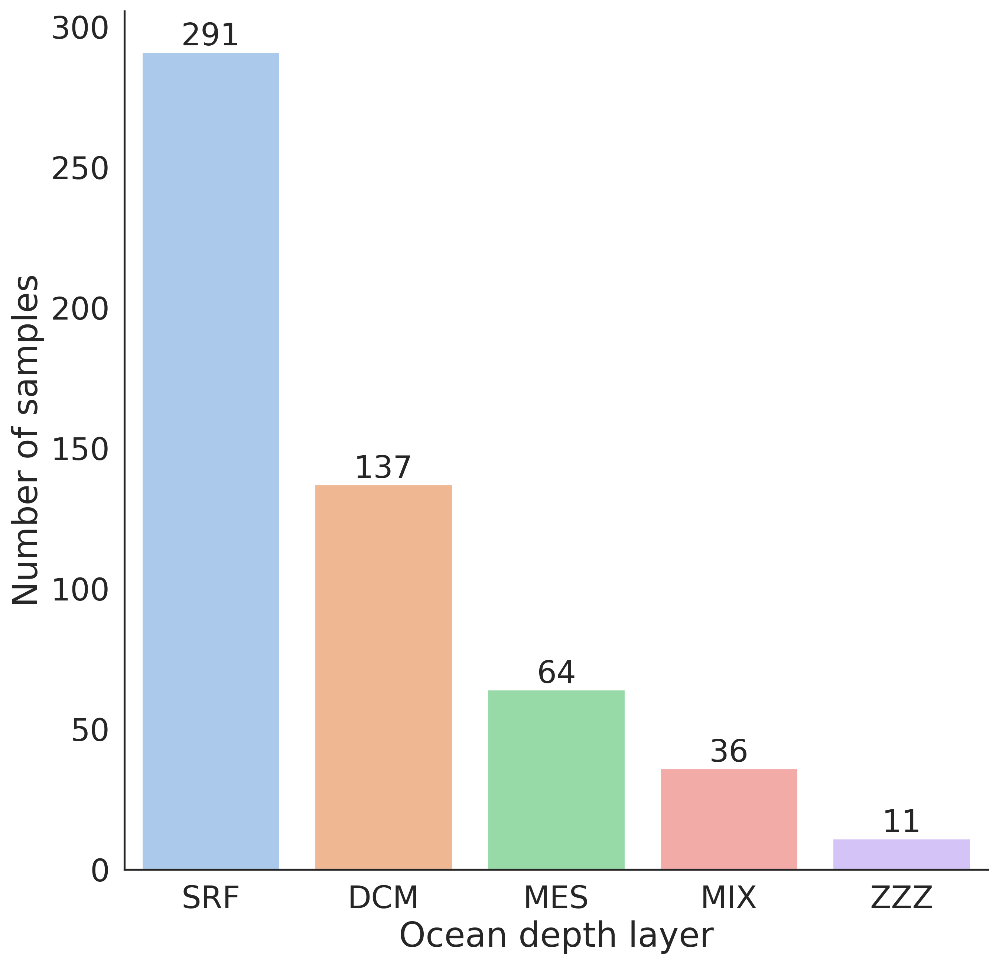

In [ ]:
# Copying the DataFrame
df = Metatranscriptomic_env.copy()

# Using a fall color palette
palette = sns.color_palette("pastel")

# Set font sizes
sns.set(rc={'axes.labelsize': 22, 'xtick.labelsize': 20, 'ytick.labelsize': 20})
# Set white style
sns.set_style('white')

# Creating a countplot
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
plot = sns.countplot(data=df, x="Feature", palette=palette, ax=ax)

# Adding values on top of the bars
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points', fontsize=20)

# Changing x and y labels
ax.set_xlabel("Ocean depth layer")
ax.set_ylabel("Number of samples")

# Removing the top and right spines
sns.despine()

# Saving the figure
fig.savefig(path+"figures/NumberOfSamplesPerDepthLayer.png")

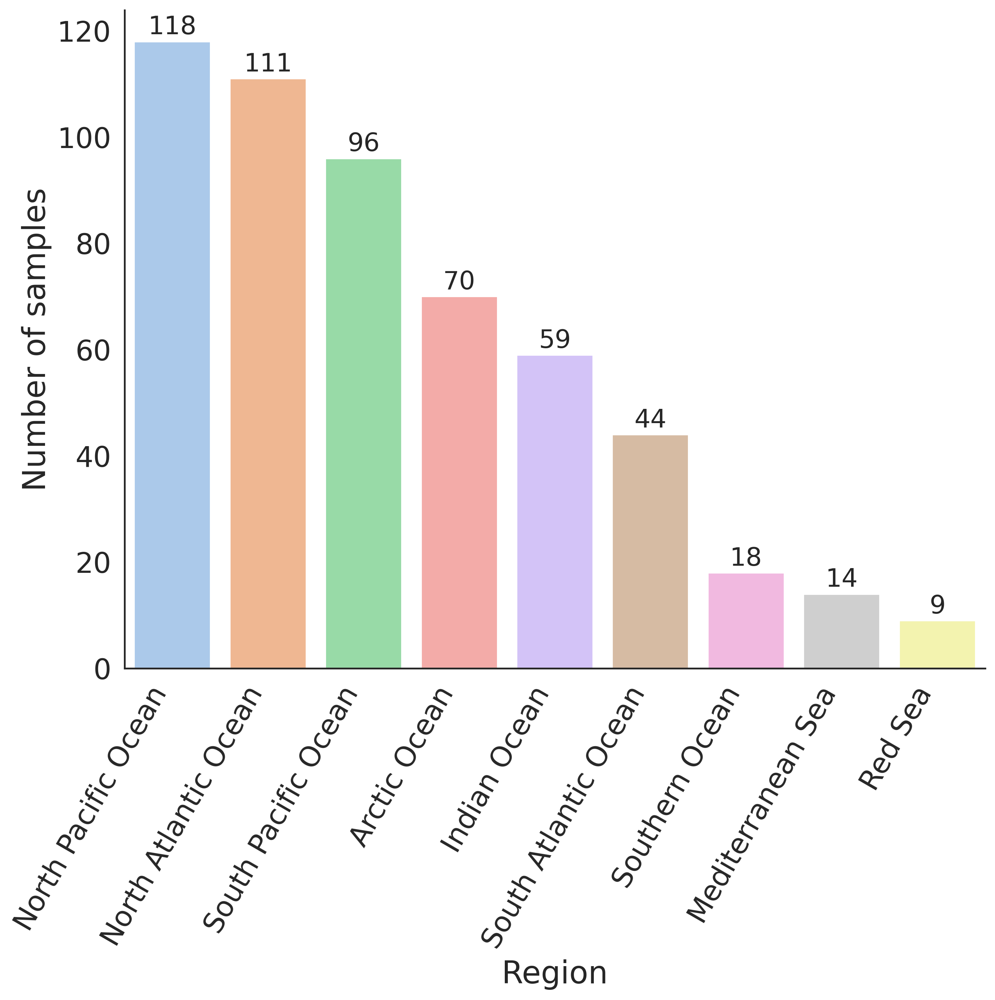

In [ ]:
# Copying the DataFrame
df = Metatranscriptomic_env.copy()

# Calculate the count of each region
region_counts = df['Region'].value_counts()

# Sort the regions based on counts in descending order
sorted_regions = region_counts.index

# Using a pastel color palette
palette = sns.color_palette("pastel")

# Creating a countplot with sorted regions
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
plot = sns.countplot(data=df, x="Region", palette=palette, order=sorted_regions, ax=ax)

# Adding values on top of the bars
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points', fontsize=18)

# Changing x and y labels
ax.set_xlabel("Region")
ax.set_ylabel("Number of samples")

# Rotate x-axis labels vertically
ax.set_xticklabels(ax.get_xticklabels(), rotation=60, ha='right')

# Removing the top and right spines
sns.despine()

# Adjust bottom margin to accommodate rotated labels
plt.subplots_adjust(bottom=0.2)

# Saving the figure
plt.tight_layout()
fig.savefig(path+"figures/NumberOfSamplesPerRegion.png")

### Plastic pollution plots

In [7]:
# Copying the DataFrame
df_env = Metatranscriptomic_env.copy()
df = Metatranscriptomic_diamond_norm_counts_per_hit.copy()
df = df.merge(df_env, left_index=True, right_index=True)
df = df.rename(columns={"Plastic_count": "Plastic pollution"})
df

,Hits,Device,Year,Latitude,Longitude,Feature,Depth top,Sample material,Biome,Region,...,SSM,u,v,OW,MLE,RT,Age,Lat_plastic,Lon_plastic,Plastic pollution
ERR1001626,6.450376,High Volume Peristaltic Pump,2010,-20.9354,-35.1803,SRF,3.0,0.22-3,Trades Biome,South Atlantic Ocean,...,1.200000e-07,0.479170,2.691546,0.084131,0.027592,0.000000,120.0,-21.0,-35.2,3.449604
ERR1001627,6.404646,High Volume Peristaltic Pump,2010,-30.1367,-43.2899,SRF,3.0,0.22-3,Trades Biome,South Atlantic Ocean,...,1.578700e-05,8.645021,-6.421140,0.053558,0.148190,5.777778,68.0,-30.2,-43.2,2.993198
ERR1328122,6.282551,High Volume Peristaltic Pump,2012,36.1715,-29.0230,SRF,3.0,0.22-3,Westerlies Biome,North Atlantic Ocean,...,1.058100e-05,-4.997032,3.058714,-0.157861,0.025897,37.583333,76.0,36.2,-29.0,3.896750
ERR1328123,6.385315,High Volume Peristaltic Pump,2010,18.5839,66.4727,DCM,23.0,0.22-1.6,Trades Biome,Indian Ocean,...,9.598900e-05,-0.557961,15.046586,0.403157,NaN,2.250000,120.0,18.6,66.4,4.027151
ERR1328124,6.386757,High Volume Peristaltic Pump,2010,18.5839,66.4727,DCM,23.0,0.22-1.6,Trades Biome,Indian Ocean,...,9.598900e-05,-0.557961,15.046586,0.403157,NaN,2.250000,120.0,18.6,66.4,4.027151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR3587200,6.236529,High Volume Peristaltic Pump,2011,-8.9111,-142.5571,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,...,8.210000e-07,1.059620,-2.544526,-0.004254,0.014455,0.000000,120.0,-9.0,-142.6,1.676520
ERR3587201,6.269340,High Volume Peristaltic Pump,2011,-8.9971,-139.1963,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,...,4.056000e-06,-13.524453,5.403076,0.007751,0.028977,15.833333,120.0,-9.0,-139.2,1.903081
ERR3587202,6.256389,High Volume Peristaltic Pump,2011,-8.9068,-140.2830,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,...,1.077000e-06,-4.286042,2.890793,-0.011503,0.053774,1.083333,120.0,-9.0,-140.2,1.567905
ERR3587203,6.157732,High Volume Peristaltic Pump,2011,-9.1504,-140.5216,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,...,2.460000e-06,-2.752385,-2.994587,0.000096,0.043603,2.777778,37.0,-9.2,-140.6,1.841432


#### Plastic Pollution Per Depth Layer

##### ANOVA

In [63]:
# Extract measurements for each category
categories = df['Feature'].unique()
category_data = [df['Plastic pollution'][df['Feature'] == cat] for cat in categories]

# Perform one-way ANOVA
f_statistic, p_value = stats.f_oneway(*category_data)

# Print the results
print("F-statistic:", f_statistic)
print("P-value:", p_value)

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference between groups.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference between groups.")

F-statistic: 3.397920763971288
P-value: 0.009287556811346704
Reject the null hypothesis. There is a significant difference between groups.


##### Turkey's

In [68]:
# Perform Tukey's HSD test
turkeys = pairwise_tukeyhsd(df['Plastic pollution'], df['Feature'], alpha=0.05)
tukey_summary = turkeys.summary()

# Extract the names of the comparisons and their p-values
data_array = np.array(tukey_summary.data)
comparisons = data_array[:, :2]
pvalues = data_array[:, 3]
reject = data_array[:, -1]

# Display or use the extracted information as needed
pairs = []
formatted_pvalues = []
for i in range(len(comparisons)):
  if reject[i] == "True":
    pairs.append((comparisons[i][0], comparisons[i][1]))
    formatted_pvalues.append(f'p-adj={pvalues[i]}')

  print(turkeys)

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
   DCM    MES   0.4276 0.0372  0.0161 0.8391   True
   DCM    MIX   0.0524 0.9986 -0.4567 0.5614  False
   DCM    SRF   0.0527 0.9862 -0.2289 0.3343  False
   DCM    ZZZ   0.7348 0.1276 -0.1169 1.5865  False
   MES    MIX  -0.3752 0.3666 -0.9414  0.191  False
   MES    SRF  -0.3749 0.0503 -0.7501 0.0003  False
   MES    ZZZ   0.3073 0.8778 -0.5798 1.1944  False
   MIX    SRF   0.0003    1.0 -0.4799 0.4805  False
   MIX    ZZZ   0.6825 0.2698 -0.2539 1.6188  False
   SRF    ZZZ   0.6822 0.1679 -0.1526  1.517  False
---------------------------------------------------
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
   DCM    MES   0.4276 0.0372  0.0161 0.8391   True
   DCM    MIX   0.0524 0.9986 -0.4567 0.5614  False
   DCM    SR

##### Plot

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DCM vs. MES: p-adj=0.0372


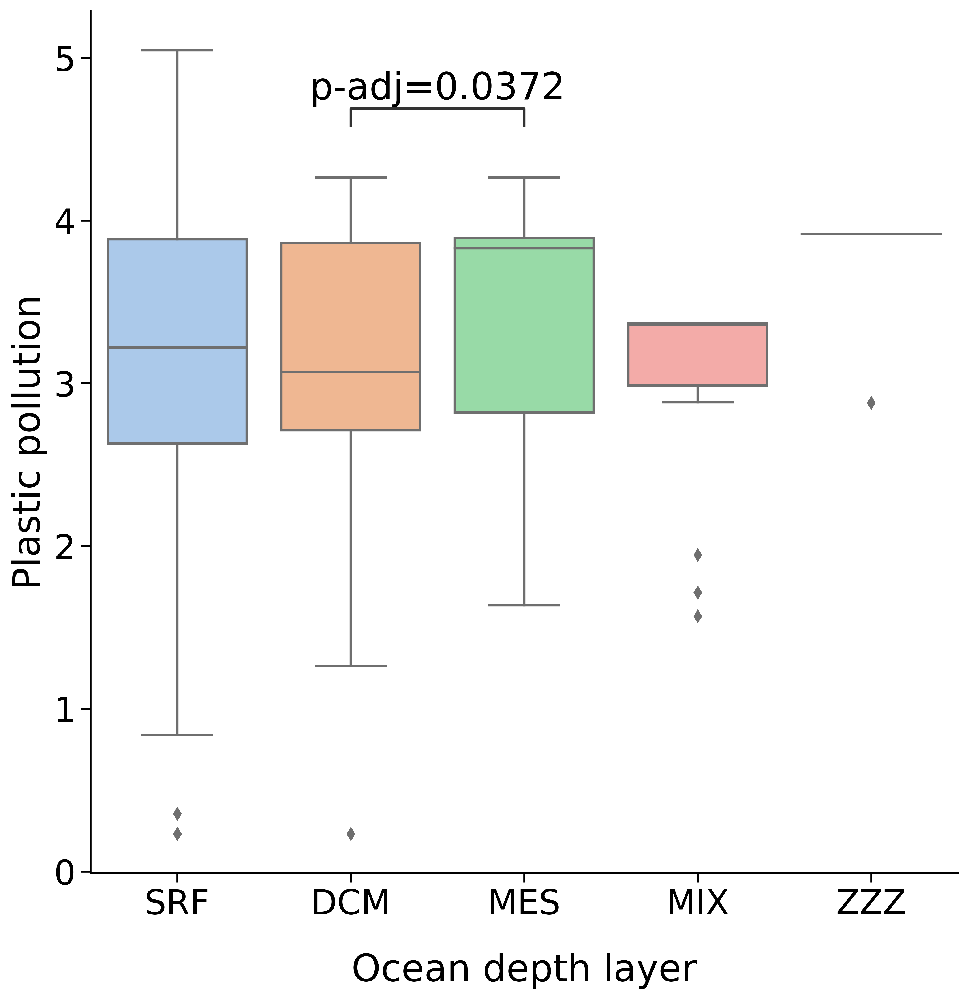

In [60]:
# Putting the parameters in a dictionary avoids code duplication
# since we use the same for `sns.boxplot` and `Annotator` calls
plotting_parameters = {
    'data':    df,
    'x':       'Feature',
    'y':       'Plastic pollution',
    'palette': sns.color_palette("pastel")
}

with sns.plotting_context('notebook', font_scale = 2):
    # Create new plot
    fig, ax = plt.subplots(1, 1, figsize=(10,10), dpi=500)

    # Plot with seaborn
    sns.boxplot(**plotting_parameters)

    # Add annotations
    annotator = Annotator(ax, pairs, **plotting_parameters)
    annotator.set_custom_annotations(formatted_pvalues)
    annotator.annotate()

    # Remove the top and right spines
    sns.despine()

    # Label and show
    ax.set_xlabel("Ocean depth layer", labelpad=20)
    plt.show()

    fig.savefig(path+"figures/PlasticPollutionPerDepthLayer.png")

#### Plastic Pollution Per Region

##### ANOVA

In [61]:
# Extract measurements for each category
categories = df['Region'].unique()
category_data = [df['Plastic pollution'][df['Region'] == cat] for cat in categories]

# Perform one-way ANOVA
f_statistic, p_value = stats.f_oneway(*category_data)

# Print the results
print("F-statistic:", f_statistic)
print("P-value:", p_value)

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference between groups.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference between groups.")

F-statistic: 90.80734685578682
P-value: 2.818147722350872e-94
Reject the null hypothesis. There is a significant difference between groups.


##### Turkey's

In [69]:
# Perform Tukey's HSD test
turkeys = pairwise_tukeyhsd(df['Plastic pollution'], df['Region'], alpha=0.05)
tukey_summary = turkeys.summary()

# Extract the names of the comparisons and their p-values
data_array = np.array(tukey_summary.data)
comparisons = data_array[:, :2]
pvalues = data_array[:, 3]
reject = data_array[:, -1]

# Display or use the extracted information as needed
pairs = []
formatted_pvalues = []
for i in range(len(comparisons)):
  if reject[i] == "True":
    pairs.append((comparisons[i][0], comparisons[i][1]))
    formatted_pvalues.append(f'p-adj={pvalues[i]}')

  print(turkeys)

              Multiple Comparison of Means - Tukey HSD, FWER=0.05               
       group1               group2        meandiff p-adj   lower   upper  reject
--------------------------------------------------------------------------------
        Arctic Ocean         Indian Ocean   1.2823    0.0  0.9214  1.6431   True
        Arctic Ocean    Mediterranean Sea   1.8302    0.0  1.2325   2.428   True
        Arctic Ocean North Atlantic Ocean   1.4477    0.0  1.1361  1.7593   True
        Arctic Ocean  North Pacific Ocean    0.877    0.0  0.5689   1.185   True
        Arctic Ocean              Red Sea   1.5973    0.0  0.8743  2.3203   True
        Arctic Ocean South Atlantic Ocean   0.5062 0.0022  0.1134   0.899   True
        Arctic Ocean  South Pacific Ocean   0.2299 0.3866  -0.091  0.5508  False
        Arctic Ocean       Southern Ocean  -2.1308    0.0 -2.6704 -1.5912   True
        Indian Ocean    Mediterranean Sea   0.5479 0.1143  -0.059  1.1549  False
        Indian Ocean North A

##### Plot

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Arctic Ocean vs. Red Sea: p-adj=0.0
Mediterranean Sea vs. South Pacific Ocean: p-adj=0.0
South Atlantic Ocean vs. North Atlantic Ocean: p-adj=0.0
Red Sea vs. North Pacific Ocean: p-adj=0.0415
North Pacific Ocean vs. Southern Ocean: p-adj=0.0
Mediterranean Sea vs. Arctic Ocean: p-adj=0.0
Arctic Ocean vs. North Pacific Ocean: p-adj=0.0
South Atlantic Ocean vs. Indian Ocean: p-adj=0.0
Indian Ocean vs. South Pacific Ocean: p-adj=0.0
South Pacific Ocean vs. Red Sea: p-adj=0.0
Red Sea vs. Southern Ocean: p-adj=0.0
Indian Ocean vs. Arctic Ocean: p-adj=0.0
Arctic Ocean vs. Southern Ocean: p-adj=0.0
South Atlantic Ocean vs. Mediterranean Sea: p-adj=0.0
North Atlantic Ocean vs. South Pacific Ocean: p-adj=0.0
South Pacific Ocean vs. North Pacific Ocean: p-adj=0.0
North Atlantic Ocean vs. Arctic Ocean: p-adj=

<ipython-input-76-26df112ca215>:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=18)


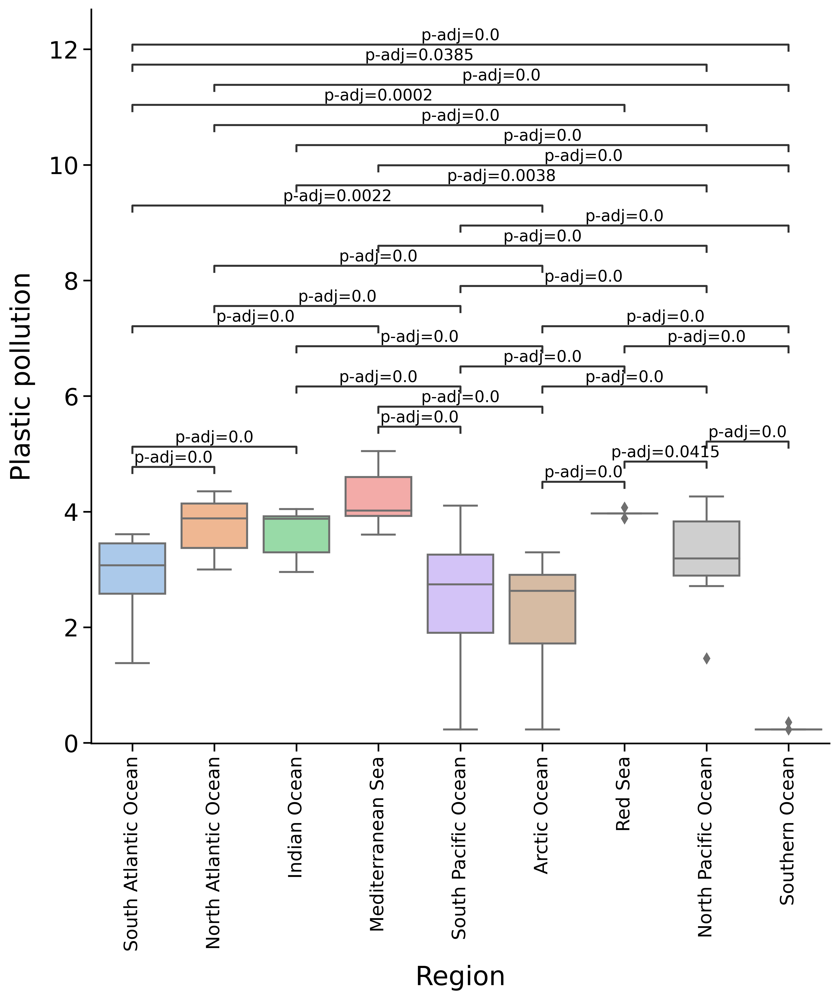

<Figure size 640x480 with 0 Axes>

In [76]:
# Putting the parameters in a dictionary avoids code duplication
# since we use the same for `sns.boxplot` and `Annotator` calls
plotting_parameters = {
    'data':    df,
    'x':       'Region',
    'y':       'Plastic pollution',
    'palette': sns.color_palette("pastel")
}

with sns.plotting_context('notebook', font_scale = 1):
    # Create new plot
    fig, ax = plt.subplots(1, 1, figsize=(10,10), dpi=500)

    # Plot with seaborn
    sns.boxplot(**plotting_parameters)

    # Add annotations
    annotator = Annotator(ax, pairs, **plotting_parameters)
    annotator.set_custom_annotations(formatted_pvalues)
    annotator.annotate()

    # Remove the top and right spines
    sns.despine()

    # Label and show
    ax.set_xlabel("Region", labelpad=10, fontsize=20)
    ax.set_ylabel("Plastic pollution", labelpad=10, fontsize=20)

    # Set font sizes
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=14)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=18)

    # Rotate x axis
    plt.xticks(rotation=90)

    plt.show()

plt.tight_layout()
fig.savefig(path+"figures/PlasticPollutionPerRegion.png")

#### Hits Per Depth Layer

##### ANOVA

In [77]:
# Extract measurements for each category
categories = df['Feature'].unique()
category_data = [df['Hits'][df['Feature'] == cat] for cat in categories]

# Perform one-way ANOVA
f_statistic, p_value = stats.f_oneway(*category_data)

# Print the results
print("F-statistic:", f_statistic)
print("P-value:", p_value)

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference between groups.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference between groups.")

F-statistic: 6.804592926526616
P-value: 2.3980145611239762e-05
Reject the null hypothesis. There is a significant difference between groups.


##### Turkey's

In [79]:
# Perform Tukey's HSD test
turkeys = pairwise_tukeyhsd(df['Hits'], df['Feature'], alpha=0.05)
tukey_summary = turkeys.summary()

# Extract the names of the comparisons and their p-values
data_array = np.array(tukey_summary.data)
comparisons = data_array[:, :2]
pvalues = data_array[:, 3]
reject = data_array[:, -1]

# Display or use the extracted information as needed
pairs = []
formatted_pvalues = []
for i in range(len(comparisons)):
  if reject[i] == "True":
    pairs.append((comparisons[i][0], comparisons[i][1]))
    formatted_pvalues.append(f'p-adj={pvalues[i]}')

  print(turkeys)

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
   DCM    MES   0.0801 0.0002  0.0289  0.1313   True
   DCM    MIX   0.0195 0.9176 -0.0439  0.0828  False
   DCM    SRF   0.0448 0.0045  0.0098  0.0799   True
   DCM    ZZZ  -0.0508 0.6842 -0.1568  0.0552  False
   MES    MIX  -0.0607  0.129 -0.1311  0.0098  False
   MES    SRF  -0.0353 0.2353  -0.082  0.0114  False
   MES    ZZZ  -0.1309 0.0109 -0.2413 -0.0205   True
   MIX    SRF   0.0254 0.7726 -0.0344  0.0851  False
   MIX    ZZZ  -0.0702 0.4659 -0.1868  0.0463  False
   SRF    ZZZ  -0.0956 0.0878 -0.1995  0.0083  False
----------------------------------------------------
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
   DCM    MES   0.0801 0.0002  0.0289  0.1313   True
   DCM    MIX   0.0195 0.9176 -0.0439  0.0828 

##### Plot

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DCM vs. MES: p-adj=0.0002
SRF vs. DCM: p-adj=0.0045
MES vs. ZZZ: p-adj=0.0109


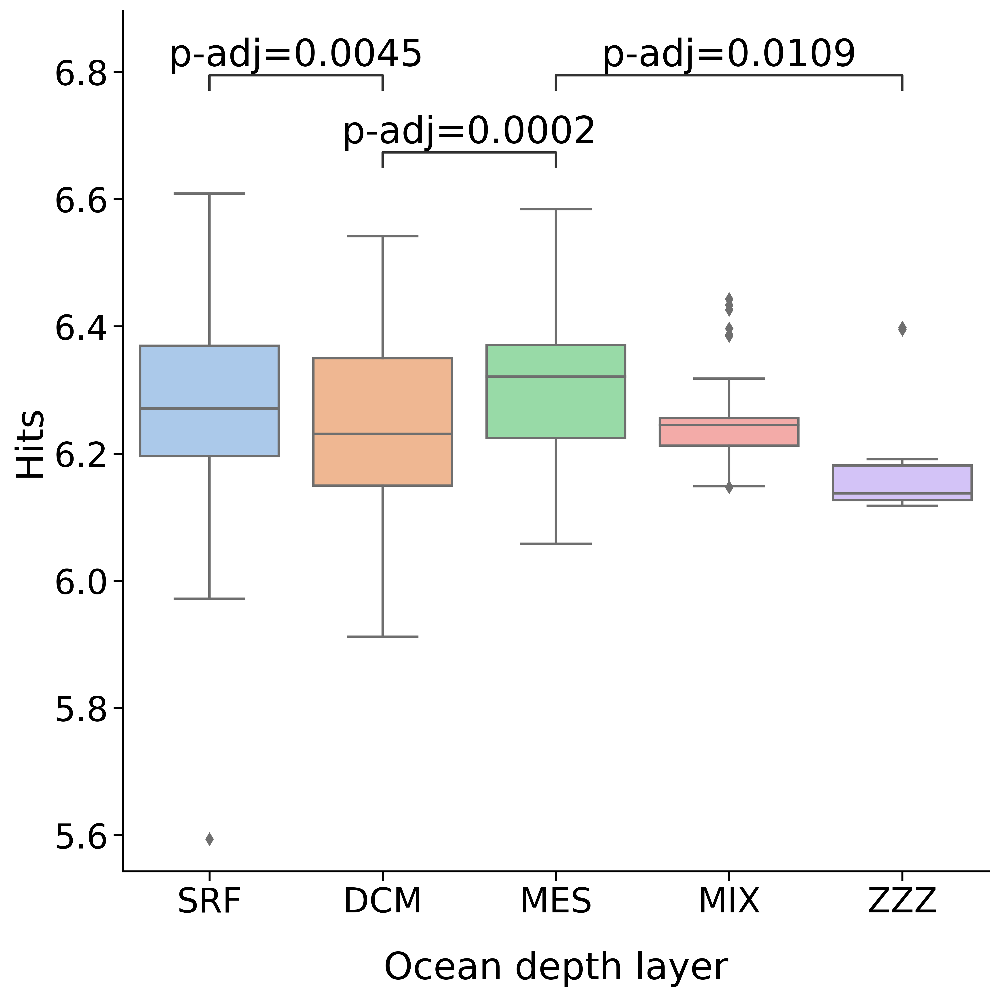

In [80]:
# Putting the parameters in a dictionary avoids code duplication
# since we use the same for `sns.boxplot` and `Annotator` calls
plotting_parameters = {
    'data':    df,
    'x':       'Feature',
    'y':       'Hits',
    'palette': sns.color_palette("pastel")
}

with sns.plotting_context('notebook', font_scale = 2):
    # Create new plot
    fig, ax = plt.subplots(1, 1, figsize=(10,10), dpi=500)

    # Plot with seaborn
    sns.boxplot(**plotting_parameters)

    # Add annotations
    annotator = Annotator(ax, pairs, **plotting_parameters)
    annotator.set_custom_annotations(formatted_pvalues)
    annotator.annotate()

    # Remove the top and right spines
    sns.despine()

    # Label and show
    ax.set_xlabel("Ocean depth layer", labelpad=20)
    plt.show()

    fig.savefig(path+"figures/HitsPerDepthLayer.png")

#### Hits Per Region

##### ANOVA

In [82]:
# Extract measurements for each category
categories = df['Region'].unique()
category_data = [df['Hits'][df['Region'] == cat] for cat in categories]

# Perform one-way ANOVA
f_statistic, p_value = stats.f_oneway(*category_data)

# Print the results
print("F-statistic:", f_statistic)
print("P-value:", p_value)

# Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. There is a significant difference between groups.")
else:
    print("Fail to reject the null hypothesis. There is no significant difference between groups.")

F-statistic: 7.84513066618002
P-value: 5.467286664721306e-10
Reject the null hypothesis. There is a significant difference between groups.


##### Turkey's

In [83]:
# Perform Tukey's HSD test
turkeys = pairwise_tukeyhsd(df['Hits'], df['Region'], alpha=0.05)
tukey_summary = turkeys.summary()

# Extract the names of the comparisons and their p-values
data_array = np.array(tukey_summary.data)
comparisons = data_array[:, :2]
pvalues = data_array[:, 3]
reject = data_array[:, -1]

# Display or use the extracted information as needed
pairs = []
formatted_pvalues = []
for i in range(len(comparisons)):
  if reject[i] == "True":
    pairs.append((comparisons[i][0], comparisons[i][1]))
    formatted_pvalues.append(f'p-adj={pvalues[i]}')

  print(turkeys)

              Multiple Comparison of Means - Tukey HSD, FWER=0.05               
       group1               group2        meandiff p-adj   lower   upper  reject
--------------------------------------------------------------------------------
        Arctic Ocean         Indian Ocean  -0.0178 0.9957  -0.084  0.0484  False
        Arctic Ocean    Mediterranean Sea    0.054 0.8386 -0.0556  0.1637  False
        Arctic Ocean North Atlantic Ocean  -0.0895    0.0 -0.1466 -0.0323   True
        Arctic Ocean  North Pacific Ocean  -0.0343 0.6211 -0.0908  0.0222  False
        Arctic Ocean              Red Sea   0.0449   0.98 -0.0877  0.1775  False
        Arctic Ocean South Atlantic Ocean  -0.0005    1.0 -0.0725  0.0716  False
        Arctic Ocean  South Pacific Ocean   -0.067 0.0127 -0.1258 -0.0081   True
        Arctic Ocean       Southern Ocean    0.058 0.6654  -0.041  0.1569  False
        Indian Ocean    Mediterranean Sea   0.0718 0.5371 -0.0395  0.1832  False
        Indian Ocean North A

##### Plot

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

South Pacific Ocean vs. Arctic Ocean: p-adj=0.0127
North Atlantic Ocean vs. Indian Ocean: p-adj=0.0073
Mediterranean Sea vs. South Pacific Ocean: p-adj=0.0139
South Atlantic Ocean vs. North Atlantic Ocean: p-adj=0.0012
North Atlantic Ocean vs. Mediterranean Sea: p-adj=0.001
North Atlantic Ocean vs. Arctic Ocean: p-adj=0.0
South Pacific Ocean vs. Southern Ocean: p-adj=0.0019
North Atlantic Ocean vs. Red Sea: p-adj=0.0358
North Atlantic Ocean vs. North Pacific Ocean: p-adj=0.0161
North Atlantic Ocean vs. Southern Ocean: p-adj=0.0001


<ipython-input-84-f3b5dd449c57>:31: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=18)


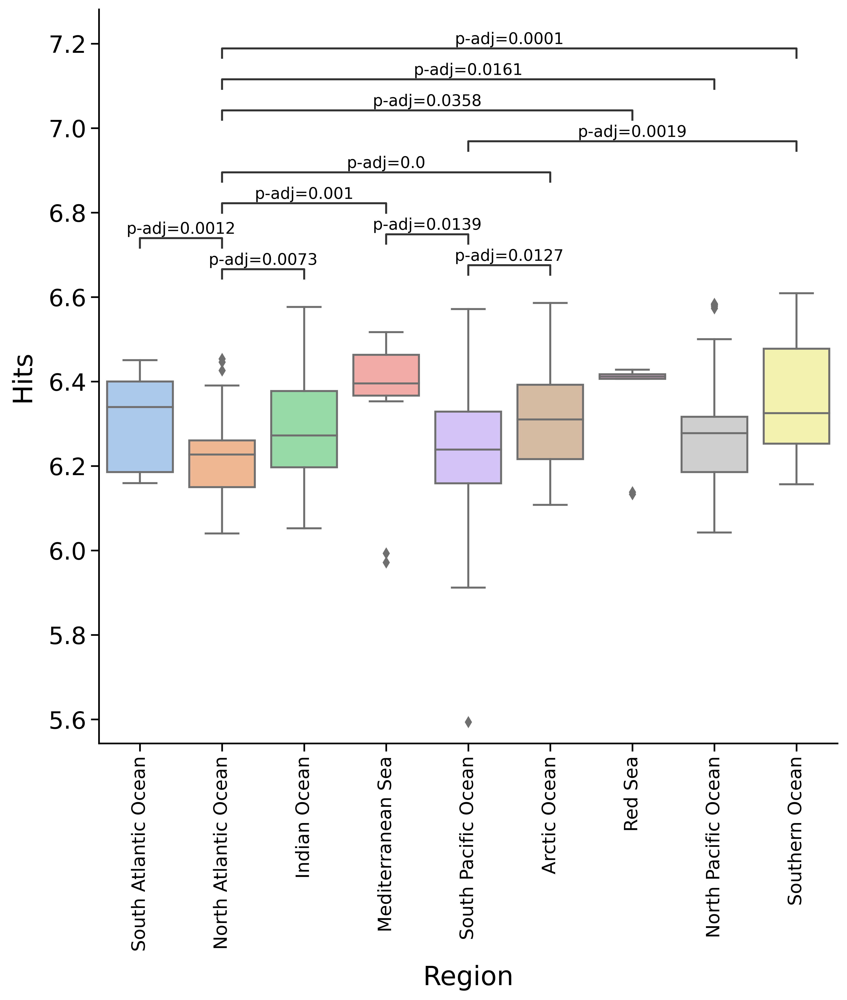

<Figure size 640x480 with 0 Axes>

In [84]:
# Putting the parameters in a dictionary avoids code duplication
# since we use the same for `sns.boxplot` and `Annotator` calls
plotting_parameters = {
    'data':    df,
    'x':       'Region',
    'y':       'Hits',
    'palette': sns.color_palette("pastel")
}

with sns.plotting_context('notebook', font_scale = 1):
    # Create new plot
    fig, ax = plt.subplots(1, 1, figsize=(10,10), dpi=500)

    # Plot with seaborn
    sns.boxplot(**plotting_parameters)

    # Add annotations
    annotator = Annotator(ax, pairs, **plotting_parameters)
    annotator.set_custom_annotations(formatted_pvalues)
    annotator.annotate()

    # Remove the top and right spines
    sns.despine()

    # Label and show
    ax.set_xlabel("Region", labelpad=10, fontsize=20)
    ax.set_ylabel("Hits", labelpad=10, fontsize=20)

    # Set font sizes
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=14)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=18)

    # Rotate x axis
    plt.xticks(rotation=90)

    plt.show()

plt.tight_layout()
fig.savefig(path+"figures/HitsPerRegion.png")

## Get plastic pollution and hits means

### Mean by region

In [96]:
mean_by_region = pd.DataFrame(df.groupby('Region')['Hits'].mean())
mean_by_region.sort_values(by="Hits")

,Hits
Region,
North Atlantic Ocean,6.218491
South Pacific Ocean,6.241019
North Pacific Ocean,6.273703
Indian Ocean,6.290174
South Atlantic Ocean,6.307493
Arctic Ocean,6.307981
Red Sea,6.352910
Mediterranean Sea,6.362009
Southern Ocean,6.365970


In [97]:
mean_by_region = pd.DataFrame(df.groupby('Region')['Plastic pollution'].mean())
mean_by_region.sort_values(by="Plastic pollution")

,Plastic pollution
Region,
Southern Ocean,0.244726
Arctic Ocean,2.375511
South Pacific Ocean,2.605432
South Atlantic Ocean,2.881703
North Pacific Ocean,3.252475
Indian Ocean,3.657789
North Atlantic Ocean,3.823228
Red Sea,3.972771
Mediterranean Sea,4.205722


### Mean by depth

In [100]:
mean_by_region = pd.DataFrame(df.groupby('Feature')['Hits'].mean())
mean_by_region.sort_values(by="Hits")

,Hits
Feature,
ZZZ,6.187453
DCM,6.238230
MIX,6.257697
SRF,6.283078
MES,6.318366


In [101]:
mean_by_region = pd.DataFrame(df.groupby('Feature')['Plastic pollution'].mean())
mean_by_region.sort_values(by="Plastic pollution")

,Plastic pollution
Feature,
DCM,2.993622
MIX,3.045987
SRF,3.046295
MES,3.421184
ZZZ,3.728451


## Statistical analysis

### Correlation

#### Whole dataset correlations

In [3]:
# Ddownload if necessary
Metatranscriptomic_diamond_norm_counts_per_hit = pd.read_csv(repo_url+"Metatranscriptomic_diamond_norm_counts_per_hit.tsv", sep = "\t", index_col=0)
Metatranscriptomic_diamond_norm_counts_per_hit

,Hits
ERR1001626,6.450376
ERR1001627,6.404646
ERR1328122,6.282551
ERR1328123,6.385315
ERR1328124,6.386757
...,...
ERR3587200,6.236529
ERR3587201,6.269340
ERR3587202,6.256389
ERR3587203,6.157732


In [4]:
# Ddownload if necessary
Metatranscriptomic_env = pd.read_csv(repo_url+"Metatranscriptomic_env.tsv", sep = "\t", index_col=0)
Metatranscriptomic_env

,Device,Year,Latitude,Longitude,Feature,Depth top,Sample material,Biome,Region,Province,...,SSM,u,v,OW,MLE,RT,Age,Lat_plastic,Lon_plastic,Plastic_count
ERR1001626,High Volume Peristaltic Pump,2010,-20.9354,-35.1803,SRF,3.0,0.22-3,Trades Biome,South Atlantic Ocean,South Atlantic Gyral Province,...,1.200000e-07,0.479170,2.691546,0.084131,0.027592,0.000000,120.0,-21.0,-35.2,3.449604
ERR1001627,High Volume Peristaltic Pump,2010,-30.1367,-43.2899,SRF,3.0,0.22-3,Trades Biome,South Atlantic Ocean,South Atlantic Gyral Province,...,1.578700e-05,8.645021,-6.421140,0.053558,0.148190,5.777778,68.0,-30.2,-43.2,2.993198
ERR1328122,High Volume Peristaltic Pump,2012,36.1715,-29.0230,SRF,3.0,0.22-3,Westerlies Biome,North Atlantic Ocean,North Atlantic Subtropical Gyral Province,...,1.058100e-05,-4.997032,3.058714,-0.157861,0.025897,37.583333,76.0,36.2,-29.0,3.896750
ERR1328123,High Volume Peristaltic Pump,2010,18.5839,66.4727,DCM,23.0,0.22-1.6,Trades Biome,Indian Ocean,Indian Monsoon Gyres Province,...,9.598900e-05,-0.557961,15.046586,0.403157,NaN,2.250000,120.0,18.6,66.4,4.027151
ERR1328124,High Volume Peristaltic Pump,2010,18.5839,66.4727,DCM,23.0,0.22-1.6,Trades Biome,Indian Ocean,Indian Monsoon Gyres Province,...,9.598900e-05,-0.557961,15.046586,0.403157,NaN,2.250000,120.0,18.6,66.4,4.027151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR3587200,High Volume Peristaltic Pump,2011,-8.9111,-142.5571,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,"South Pacific Subtropical Gyre Province, North...",...,8.210000e-07,1.059620,-2.544526,-0.004254,0.014455,0.000000,120.0,-9.0,-142.6,1.676520
ERR3587201,High Volume Peristaltic Pump,2011,-8.9971,-139.1963,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,"South Pacific Subtropical Gyre Province, North...",...,4.056000e-06,-13.524453,5.403076,0.007751,0.028977,15.833333,120.0,-9.0,-139.2,1.903081
ERR3587202,High Volume Peristaltic Pump,2011,-8.9068,-140.2830,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,"South Pacific Subtropical Gyre Province, North...",...,1.077000e-06,-4.286042,2.890793,-0.011503,0.053774,1.083333,120.0,-9.0,-140.2,1.567905
ERR3587203,High Volume Peristaltic Pump,2011,-9.1504,-140.5216,SRF,3.0,0.22-3,Trades Biome,South Pacific Ocean,"South Pacific Subtropical Gyre Province, North...",...,2.460000e-06,-2.752385,-2.994587,0.000096,0.043603,2.777778,37.0,-9.2,-140.6,1.841432


In [50]:
df = Metatranscriptomic_diamond_norm_counts_per_hit.copy()
df_env = Metatranscriptomic_env.copy()
df = df_env.merge(df, left_index=True, right_index=True)
df = df.rename(columns={"Plastic_count": "Plastic pollution"})
df = df.select_dtypes(include='number')
df = df.drop(["Lat_plastic", "Lon_plastic", "SST.1"], axis=1)
df

,Year,Latitude,Longitude,Depth top,SSD,PAR,SST,Fe,NH4,NO2,...,Bathy depth,SSM,u,v,OW,MLE,RT,Age,Plastic pollution,Hits
ERR1001626,2010,-20.9354,-35.1803,3.0,755.0,50.914387,23.797660,0.000777,0.011959,0.013930,...,-3847.0,1.200000e-07,0.479170,2.691546,0.084131,0.027592,0.000000,120.0,3.449604,6.450376
ERR1001627,2010,-30.1367,-43.2899,3.0,802.0,58.560814,20.826770,0.000863,0.017719,0.012365,...,-3887.0,1.578700e-05,8.645021,-6.421140,0.053558,0.148190,5.777778,68.0,2.993198,6.404646
ERR1328122,2012,36.1715,-29.0230,3.0,704.0,39.292362,17.128305,0.001300,0.021045,0.036169,...,-3478.0,1.058100e-05,-4.997032,3.058714,-0.157861,0.025897,37.583333,76.0,3.896750,6.282551
ERR1328123,2010,18.5839,66.4727,23.0,724.0,50.035100,NaN,0.001388,0.025510,0.004729,...,-3265.0,9.598900e-05,-0.557961,15.046586,0.403157,NaN,2.250000,120.0,4.027151,6.385315
ERR1328124,2010,18.5839,66.4727,23.0,724.0,50.035100,NaN,0.001388,0.025510,0.004729,...,-3265.0,9.598900e-05,-0.557961,15.046586,0.403157,NaN,2.250000,120.0,4.027151,6.386757
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR3587200,2011,-8.9111,-142.5571,3.0,706.0,48.733710,26.692906,0.000002,0.017486,0.024333,...,-4403.0,8.210000e-07,1.059620,-2.544526,-0.004254,0.014455,0.000000,120.0,1.676520,6.236529
ERR3587201,2011,-8.9971,-139.1963,3.0,701.0,45.464985,26.684481,0.000002,0.030112,0.087558,...,-3444.0,4.056000e-06,-13.524453,5.403076,0.007751,0.028977,15.833333,120.0,1.903081,6.269340
ERR3587202,2011,-8.9068,-140.2830,3.0,703.0,46.940914,26.730190,0.000002,0.025083,0.054778,...,-966.0,1.077000e-06,-4.286042,2.890793,-0.011503,0.053774,1.083333,120.0,1.567905,6.256389
ERR3587203,2011,-9.1504,-140.5216,3.0,704.0,46.261963,26.539827,0.000002,0.023189,0.052578,...,-2640.0,2.460000e-06,-2.752385,-2.994587,0.000096,0.043603,2.777778,37.0,1.841432,6.157732


In [51]:
# Plot heat map of correlations
corrmat = df.corr(method="pearson")
fig, ax = plt.subplots(figsize=(20, 20), dpi=500)
sns.heatmap(corrmat, vmax=1, annot=True, linewidths=.5)
plt.savefig(path+"figures/CorrelationAllVariablesPerHit.png")

### Test correlations

In [9]:
# Test correlation of Plastic pollution to Hits
corr_coefficient, p_value = pearsonr(df["Plastic pollution"], df["Hits"])
print(f"Correlation Coefficient: {corr_coefficient}")
print(f"P-value: {p_value}")

Correlation Coefficient: -0.033738911072089026
P-value: 0.4343913504906502


In [34]:
# Plot correlations to plastic pollution
df = corrmat.copy()
df = pd.DataFrame(df["Plastic pollution"], columns=["Plastic pollution"])
df = df.sort_values(by=["Plastic pollution"], ascending=False)
df = df.drop(["Plastic pollution"], axis=0)
df["Variable"] = df.index
df

,Plastic pollution,Variable
Fe,0.484942,Fe
SST,0.475492,SST
Age,0.282618,Age
MLE,0.261797,MLE
Latitude,0.256378,Latitude
SSM,0.237614,SSM
Depth top,0.132195,Depth top
u,0.121850,u
v,0.112087,v
RT,0.101340,RT


<Figure size 6000x6000 with 0 Axes>

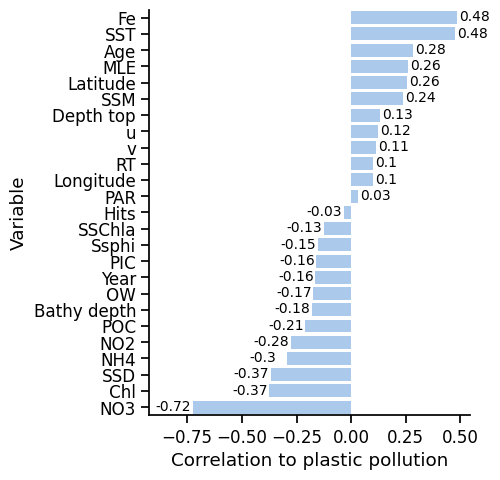

In [35]:
with sns.plotting_context('notebook', font_scale = 1.1):
  # Using a pastel color palette
  palette = sns.color_palette("pastel")

  fig = plt.figure(figsize=(12, 12), dpi=500)
  sns.catplot(x="Plastic pollution", y="Variable", data=df, kind="bar", color=palette[0])

  # Set x label
  plt.xlabel("Correlation to plastic pollution")

  # Add labels to bars
  for i in range(df.shape[0]):
    x = df["Plastic pollution"][i]
    if x >= 0:
      plt.text(x=df["Plastic pollution"][i]+0.01, y=i+0.2, s=round(df["Plastic pollution"][i], 2), size=10)
    else:
      plt.text(x=df["Plastic pollution"][i]-0.17, y=i+0.2, s=round(df["Plastic pollution"][i], 2), size=10)

  # Set x axis min value
  plt.xlim(df["Plastic pollution"].min() - 0.2)

  plt.savefig(path+"figures/CorrelationAllVariablesToPlasticPollutionBarplot.png", dpi=800)

In [52]:
# Plot correlations to hits
df = corrmat.copy()
df = pd.DataFrame(df["Hits"], columns=["Hits"])
df = df.sort_values(by=["Hits"], ascending=False)
df = df.drop(["Hits"], axis=0)
df["Variable"] = df.index
df

,Hits,Variable
SSD,0.266033,SSD
Longitude,0.158160,Longitude
Depth top,0.136684,Depth top
NO3,0.113334,NO3
Fe,0.092079,Fe
NH4,0.083855,NH4
Chl,0.081146,Chl
PAR,0.064106,PAR
PIC,0.054926,PIC
Bathy depth,0.052562,Bathy depth


<Figure size 6000x6000 with 0 Axes>

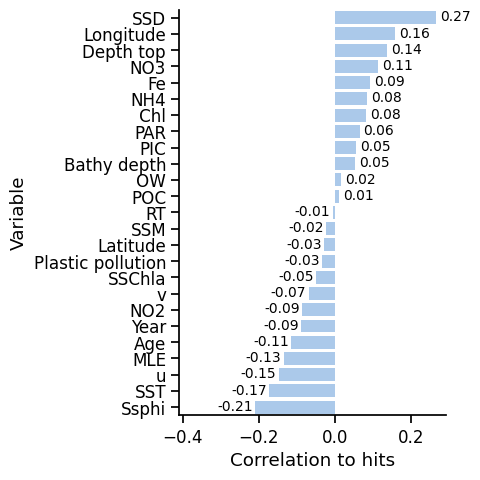

In [57]:
with sns.plotting_context('notebook', font_scale = 1.1):
  # Using a pastel color palette
  palette = sns.color_palette("pastel")

  fig = plt.figure(figsize=(12, 12), dpi=500)
  sns.catplot(x="Hits", y="Variable", data=df, kind="bar", color=palette[0])

  # Set x label
  plt.xlabel("Correlation to hits")

  # Add labels to bars
  for i in range(df.shape[0]):
    x = df["Hits"][i]
    if x >= 0:
      plt.text(x=df["Hits"][i]+0.01, y=i+0.2, s=round(df["Hits"][i], 2), size=10)
    else:
      plt.text(x=df["Hits"][i]-0.10, y=i+0.2, s=round(df["Hits"][i], 2), size=10)

  # Set x axis min value
  plt.xlim(df["Hits"].min() - 0.2)

  plt.tight_layout()
  plt.savefig(path+"figures/CorrelationAllVariablesToHitsBarplot.png", dpi=800)

In [46]:
corr_dict = {}
df_env = Metatranscriptomic_env.copy()
for region in df_env.Region.unique():
  df = Metatranscriptomic_diamond_norm_counts_per_hit.copy()
  df_env = Metatranscriptomic_env.copy()
  df_env = df_env[df_env.Region == region]
  df = df.loc[df_env.index]
  df = df.merge(df_env, left_index=True, right_index=True)
  df = df.rename(columns={"Plastic_count": "Plastic pollution"})
  df = df.select_dtypes(include='number')
  corrmat = df.corr(method="pearson")
  corr_dict[region] = corrmat['Plastic pollution']["Hits"]
df_corr = pd.DataFrame(list(corr_dict.items()), columns=["Region", "Correlation"])
df_corr

,Region,Correlation
0,South Atlantic Ocean,-0.229179
1,North Atlantic Ocean,-0.280925
2,Indian Ocean,-0.167076
3,Mediterranean Sea,-0.589108
4,South Pacific Ocean,0.222508
5,Arctic Ocean,0.028575
6,Red Sea,-0.812853
7,North Pacific Ocean,0.449245
8,Southern Ocean,0.227364


<Figure size 6000x6000 with 0 Axes>

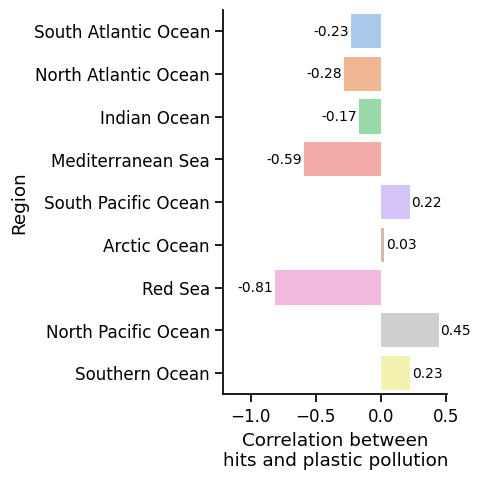

In [48]:
with sns.plotting_context('notebook', font_scale = 1.1):
  # Using a pastel color palette
  palette = sns.color_palette("pastel")

  fig = plt.figure(figsize=(12, 12), dpi=500)
  sns.catplot(x="Correlation", y="Region", data=df_corr, kind="bar", palette=palette)

  # Set x label
  plt.xlabel("Correlation between\nhits and plastic pollution")

  # Add labels to bars
  for i in range(df_corr.shape[0]):
    x = df_corr["Correlation"][i]
    if x >= 0:
      plt.text(x=df_corr["Correlation"][i]+0.01, y=i+0.1, s=round(df_corr["Correlation"][i], 2), size=10)
    else:
      plt.text(x=df_corr["Correlation"][i]-0.29, y=i+0.1, s=round(df_corr["Correlation"][i], 2), size=10)

  # Set x axis min value
  plt.xlim(df_corr["Correlation"].min() - 0.4)

  plt.tight_layout()
  plt.savefig(path+"figures/CorrelationPerRegionHitsVSPlastic.png", dpi=800)

In [40]:
corr_dict = {}
df_env = Metatranscriptomic_env.copy()
for feature in df_env.Feature.unique():
  df = Metatranscriptomic_diamond_norm_counts_per_hit.copy()
  df_env = Metatranscriptomic_env.copy()
  df_env = df_env[df_env.Feature == feature]
  df = df.loc[df_env.index]
  df = df.merge(df_env, left_index=True, right_index=True)
  df = df.rename(columns={"Plastic_count": "Plastic pollution"})
  df = df.select_dtypes(include='number')
  corrmat = df.corr(method="pearson")
  corr_dict[feature] = corrmat['Plastic pollution']["Hits"]
df_corr = pd.DataFrame(list(corr_dict.items()), columns=["Feature", "Correlation"])
df_corr

,Feature,Correlation
0,SRF,-0.093544
1,DCM,-0.098685
2,MES,0.565369
3,MIX,-0.329619
4,ZZZ,-0.977532


<Figure size 6000x6000 with 0 Axes>

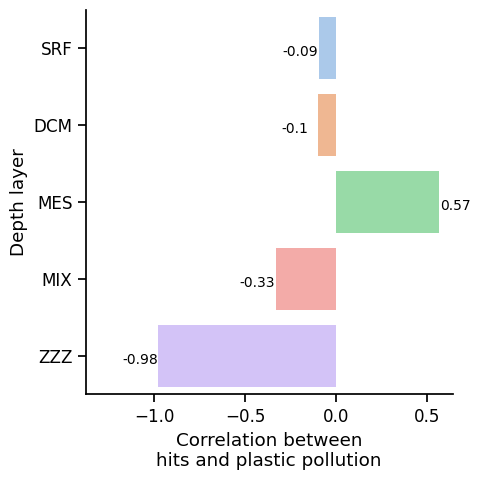

In [45]:
with sns.plotting_context('notebook', font_scale = 1.1):
  # Using a pastel color palette
  palette = sns.color_palette("pastel")

  fig = plt.figure(figsize=(12, 12), dpi=500)
  sns.catplot(x="Correlation", y="Feature", data=df_corr, kind="bar", palette=palette)

  # Set x label
  plt.xlabel("Correlation between\nhits and plastic pollution")
  plt.ylabel("Depth layer")

  # Add labels to bars
  for i in range(df_corr.shape[0]):
    x = df_corr["Correlation"][i]
    if x >= 0:
      plt.text(x=df_corr["Correlation"][i]+0.01, y=i+0.1, s=round(df_corr["Correlation"][i], 2), size=10)
    else:
      plt.text(x=df_corr["Correlation"][i]-0.2, y=i+0.1, s=round(df_corr["Correlation"][i], 2), size=10)

  # Set x axis min value
  plt.xlim(df_corr["Correlation"].min() - 0.4)

  plt.tight_layout()
  plt.savefig(path+"figures/CorrelationPerDepthHitsVSPlastic.png", dpi=800)

In [ ]:
df = Metatranscriptomic_diamond_norm_counts_per_hit.copy()
df_env = Metatranscriptomic_env.copy()
df_env = df_env[df_env.Feature == "ZZZ"]
df = df.loc[df_env.index]
df = df.merge(df_env, left_index=True, right_index=True)
df = df.rename(columns={"Plastic_count": "Plastic pollution"})
df = df.select_dtypes(include='number')
df

,Hits,Year,Latitude,Longitude,Depth top,SSD,PAR,SST,Fe,NH4,...,SSM,u,v,OW,MLE,RT,Age,Lat_plastic,Lon_plastic,Plastic pollution
ERR3586701,6.398015,2013,79.2026,66.4827,190.0,1440.0,34.024166,1.383164,0.001093,0.000589,...,NaN,NaN,NaN,NaN,0.000000,0.0,0.0,79.2,66.4,2.879744
ERR3586739,6.394871,2013,79.2026,66.4827,190.0,1440.0,34.024166,1.383164,0.001093,0.000589,...,NaN,NaN,NaN,NaN,0.000000,0.0,0.0,79.2,66.4,2.879744
ERR3586935,6.126879,2010,17.4847,67.9997,73.0,728.0,55.157024,28.731068,0.001388,0.021486,...,0.000049,33.11166,-33.418508,0.043242,0.086921,0.0,120.0,17.4,68.0,3.917052
ERR3586964,6.117954,2010,17.4825,67.9869,23.0,728.0,55.157024,28.712336,0.001388,0.021486,...,0.000051,33.11166,-33.418508,0.043242,0.086921,0.0,120.0,17.4,68.0,3.917052
ERR3586965,6.171787,2010,17.4814,67.9947,48.0,728.0,55.157024,28.712336,0.001388,0.021486,...,0.000050,33.11166,-33.418508,0.043242,0.086921,0.0,120.0,17.4,68.0,3.917052
ERR3586966,6.120859,2010,17.4831,68.0026,103.0,728.0,55.157024,28.749800,0.001388,0.021486,...,0.000049,33.11166,-33.418508,0.043242,0.086921,0.0,120.0,17.4,68.0,3.917052
ERR3586992,6.129683,2010,17.4847,67.9997,73.0,728.0,55.157024,28.731068,0.001388,0.021486,...,0.000049,33.11166,-33.418508,0.043242,0.086921,0.0,120.0,17.4,68.0,3.917052
ERR3587035,6.126839,2010,17.4847,67.9997,73.0,728.0,55.157024,28.731068,0.001388,0.021486,...,0.000049,33.11166,-33.418508,0.043242,0.086921,0.0,120.0,17.4,68.0,3.917052
ERR3587036,6.137215,2010,17.4831,68.0026,103.0,728.0,55.157024,28.749800,0.001388,0.021486,...,0.000049,33.11166,-33.418508,0.043242,0.086921,0.0,120.0,17.4,68.0,3.917052
ERR3587088,6.146906,2010,17.4825,67.9869,23.0,728.0,55.157024,28.712336,0.001388,0.021486,...,0.000051,33.11166,-33.418508,0.043242,0.086921,0.0,120.0,17.4,68.0,3.917052


### Kmeans

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
km = KMeans(n_clusters=5)
y_predicted = km.fit_predict(Metatranscriptomic_diamond_norm_counts)
y_predicted

array([1, 2, 2, 2, 2, 2, 2, 2, 4, 4, 2, 0, 2, 2, 2, 0, 2, 0, 2, 2, 2, 4,
       2, 2, 0, 2, 0, 2, 2, 4, 2, 2, 4, 4, 4, 2, 2, 4, 2, 2, 4, 2, 4, 2,
       2, 0, 2, 0, 2, 2, 0, 2, 2, 4, 4, 4, 2, 2, 4, 2, 2, 2, 2, 2, 2, 4,
       2, 0, 2, 0, 2, 2, 0, 2, 2, 0, 2, 0, 2, 2, 4, 0, 4, 2, 4, 0, 2, 2,
       2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 0, 0, 0, 2, 0, 0, 0, 0, 4, 2, 2, 2, 0, 0, 0, 0, 0,
       0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 2, 2, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 4, 2, 0, 2, 2, 2, 2, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0,
       0, 0, 2, 0, 4, 0, 4, 1, 0, 2, 0, 1, 2, 0, 1, 0, 0, 2, 2, 2, 2, 2,
       2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 2, 1, 0, 2, 0, 0, 1, 2, 4, 2, 4,
       0, 2, 2, 2, 2, 4, 0, 0, 0, 2, 0, 0, 0, 0, 0,

### PCA from sklearn

In [ ]:
import random as rd
from sklearn.decomposition import PCA
from sklearn import preprocessing
from matplotlib import pyplot as plt

Text(0.5, 1.0, 'Scree Plot')

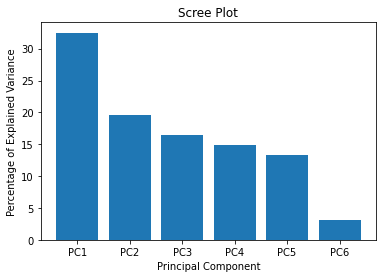

In [ ]:
df = Metatranscriptomic_diamond_norm_counts.copy()
df_env = Metatranscriptomic_env.copy()
# df_env = df_env[df_env.Feature == "SRF"]
# df_env = df_env[df_env.Biome != "Polar Biome"]
df = df.loc[df_env.index]
df = df[["PE", "LDPE", "PS", "Nylon", "PU", "PET"]]
df = df.drop(["ERR3587157", "ERR3587132"])
df_env = df_env.drop(["ERR3587157", "ERR3587132"])

scaled_data = preprocessing.scale(df)
# scaled_data = df.copy()
pca = PCA()
pca.fit(scaled_data)
pca_data = pca.transform(scaled_data)

per_var = np.round(pca.explained_variance_ratio_*100, decimals=1)
labels = ["PC" + str(i) for i in range(1, len(per_var)+1)]

plt.bar(x=range(1, len(per_var)+1), height = per_var, tick_label=labels)
plt.ylabel("Percentage of Explained Variance")
plt.xlabel("Principal Component")
plt.title("Scree Plot")

In [ ]:
pca_df = pd.DataFrame(pca_data, index=df.index.to_list(), columns=labels)
pca_df

,PC1,PC2,PC3,PC4,PC5,PC6
ERR1001626,0.671777,1.293282,1.621467,0.213575,0.324037,-0.001058
ERR1001627,-0.216762,-0.034965,0.536830,-0.104669,-0.250474,-0.196273
ERR1328122,-0.495136,-0.640061,-0.289132,-0.118705,-0.128096,-0.140462
ERR1328123,-1.069364,-0.571998,-0.204730,0.057724,-0.048729,-0.019515
ERR1328124,-1.049697,-0.554627,-0.232212,-0.027183,-0.103493,-0.069558
...,...,...,...,...,...,...
ERR3587200,-0.769362,-0.235134,-0.486489,0.498411,0.027120,-0.114277
ERR3587201,-0.493475,-0.577145,-0.309914,0.037787,-0.150656,0.178458
ERR3587202,-0.860665,-0.660007,-0.353992,0.570181,-0.110629,-0.251656
ERR3587203,-0.749113,-0.693777,-0.218053,0.350017,0.040543,-0.101191


In [ ]:
from sklearn.preprocessing import LabelEncoder
column = LabelEncoder()
cmap = column.fit_transform(df_env["Region"])
mapping = dict(zip(column.transform(column.classes_), column.classes_))
mapping

{0: 'Arctic Ocean',
 1: 'Indian Ocean',
 2: 'Mediterranean Sea',
 3: 'North Atlantic Ocean',
 4: 'North Pacific Ocean',
 5: 'Red Sea',
 6: 'South Atlantic Ocean',
 7: 'South Pacific Ocean',
 8: 'Southern Ocean'}

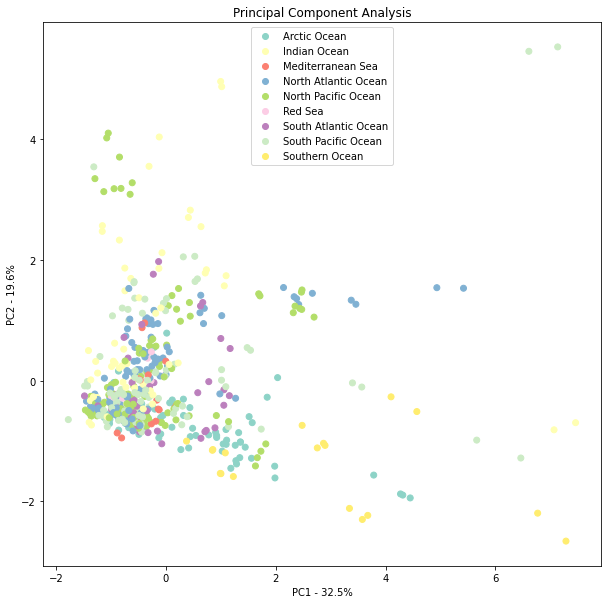

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
scatter = plt.scatter(pca_df.PC1, pca_df.PC2, c=cmap, label=labels, cmap="Set3")
plt.title("Principal Component Analysis")
plt.xlabel("PC1 - {0}%".format(per_var[0]))
plt.ylabel("PC2 - {0}%".format(per_var[1]))
handles, labels = scatter.legend_elements()
labels = [int(''.join(i for i in x if i.isdigit())) for x in labels]
labels = [mapping[x] for x in labels]
plt.legend(handles, labels)

# for sample in pca_df.index:
#   plt.annotate(sample, (pca_df.PC1.loc[sample], pca_df.PC2.loc[sample]))

In [ ]:
loading_scores = pd.Series(pca.components_[0], index=df.columns.to_list())
sorted_loading_scores = loading_scores.abs().sort_values(ascending=False)
sorted_loading_scores

PET      0.653913
PU       0.612922
LDPE     0.367743
PE       0.197210
PS       0.144642
Nylon    0.040950
dtype: float64

### PCA using PCA library

In [ ]:
!pip install pca

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 24.8 MB 2.5 MB/s 
  Created wheel for sklearn: filename=sklearn-0.0-py2.py3-none-any.whl size=1316 sha256=d786db0eff7904e8fa8f558fb2881c61e044d239a9275d9381980a6f91b74e2a
  Stored in directory: /root/.cache/pip/wheels/46/ef/c3/157e41f5ee1372d1be90b09f74f82b10e391eaacca8f22d33e
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9680 sha256=ca5a724a0bfa24f000867ec6402b9b9f1ae07c70dd0a38e8b3eafde156dc69a6
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built sklearn wget


In [ ]:
# https://erdogant.github.io/pca/pages/html/Examples.html#
from pca import pca

# Initialize to reduce the data up to the nubmer of componentes that explains 95% of the variance.
model = pca(n_components=0.95)

# Reduce the data towards 3 PCs
# model = pca(n_components=3)
df = Metatranscriptomic_diamond_norm_counts.copy()
df_env = Metatranscriptomic_env.copy()
df_env = df_env[df_env.Feature == "SRF"]
df_env = df_env[df_env.Biome != "Polar Biome"]
df = df.loc[df_env.index]
df = df[["PE", "LDPE", "PS", "Nylon", "PU", "PET"]]
df = df.drop(["ERR3587157", "ERR3587132"])
df_env = df_env.drop(["ERR3587157", "ERR3587132"])


# Fit transform
results = model.fit_transform(df)

[pca] >Processing dataframe..
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [6] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [5] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [6] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[5]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]


[0.35822161 0.62573763 0.85544747 0.94820028 0.99365021 1.        ]
[0.35822161 0.26751602 0.22970984 0.09275281 0.04544992 0.00634979]


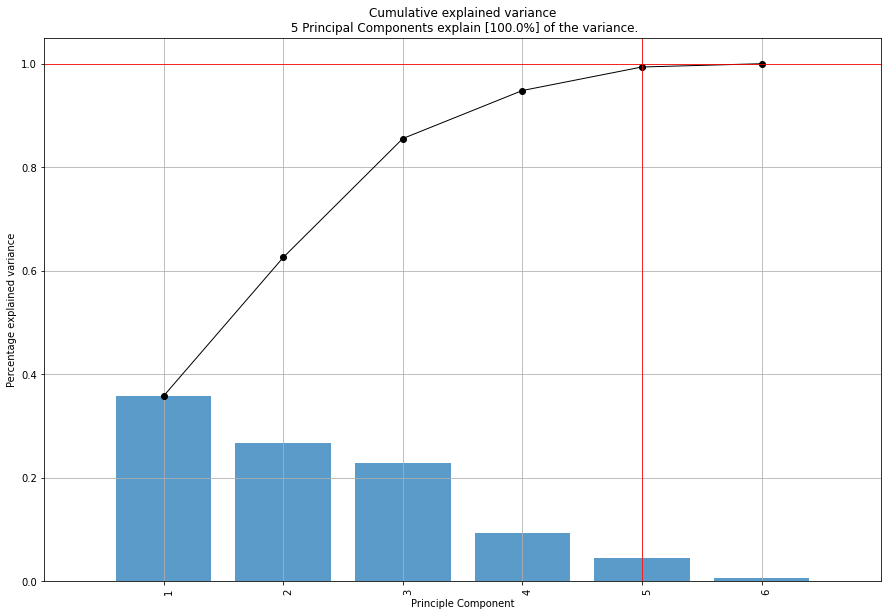

<Figure size 432x288 with 0 Axes>

In [ ]:
# Cumulative explained variance
print(model.results['explained_var'])
# [0.92461872 0.97768521 0.99478782]

# Explained variance per PC
print(model.results['variance_ratio'])
[0.92461872, 0.05306648, 0.01710261]

# Make plot
fig, ax = model.plot()

[pca] >Plot PC1 vs PC2 with loadings.


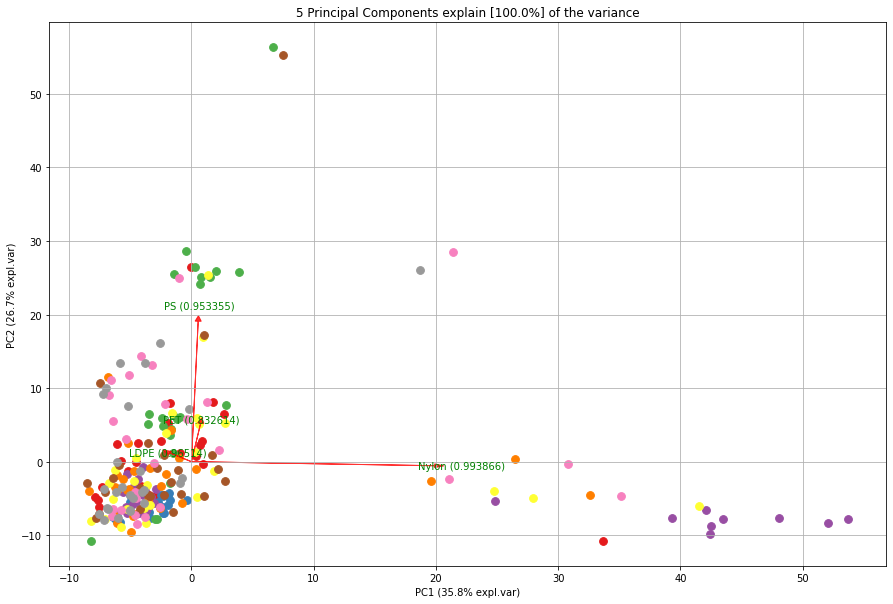

In [ ]:
# 2D plot
fig, ax = model.biplot(n_feat=4, PC=[0,1], label=False, legend=False)

[pca] >Plot PC1 vs PC2 vs PC3 with loadings.


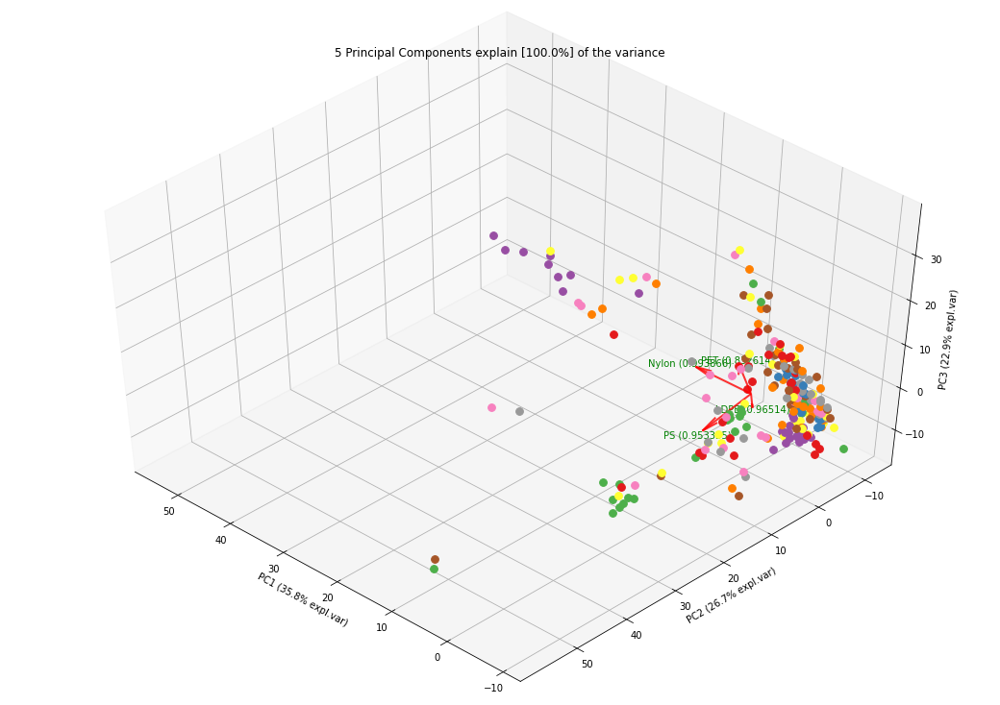

In [ ]:
# 3d Plot
fig, ax = model.biplot3d(n_feat=4, PC=[0,1,2], label=False, legend=False)

### R

In [ ]:
%load_ext rpy2.ipython

In [ ]:
df = Metatranscriptomic_diamond_norm_counts.copy()
df_env = Metatranscriptomic_env.copy()
# df_env = df_env[df_env.Feature == "SRF"]
# df_env = df_env[df_env.Biome != "Polar Biome"]
df = df.loc[df_env.index]
df = df[["PE", "LDPE", "PS", "Nylon", "PU", "PET"]]
df = df.drop(["ERR3587157", "ERR3587132"])
df_env = df_env.drop(["ERR3587157", "ERR3587132"])
df_env.to_csv(path+"df_env.tsv", sep = "\t")
df.to_csv(path+"df.tsv", sep = "\t")


In [ ]:
# Install packages
%%R
install.packages("vegan")
install.packages("MASS")
install.packages("ggplot2")


R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

R[write to console]: also installing the dependency ‘permute’


R[write to console]: trying URL 'https://cran.rstudio.com/src/contrib/permute_0.9-7.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 114805 bytes (112 KB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to 

In [ ]:
%%R

library(vegan)
library(MASS)
library(ggplot2)
data(varespec)



R[write to console]: Loading required package: permute

R[write to console]: Loading required package: lattice

R[write to console]: This is vegan 2.6-2

R[write to console]: Need help getting started? Try the R Graphics Cookbook:
https://r-graphics.org



In [ ]:
%%R
setwd("/content/drive/MyDrive/Victor/PhD/Victor/Component_5/")
getwd()

[1] "/content/drive/MyDrive/Victor/PhD/Victor/Component_5"


In [ ]:
%%R
df <- read.table("df.tsv", sep="\t", header = TRUE, row.names = 1)
df_env <- read.table("df_env.tsv", sep="\t", header=TRUE, row.names = 1)
# keeps <- c("SSD", "NH4")
# DF[keeps]
nums <- unlist(lapply(df_env, is.numeric), use.names = FALSE)
df_env_num <- df_env[ , nums]
df_env_num["Feature"] <- df_env["Feature"]
head(df_env_num)


           Year Latitude Longitude Depth.top SSD      PAR      SST          Fe
ERR1001626 2010 -20.9354  -35.1803         3 755 50.91439 23.79766 0.000776878
ERR1001627 2010 -30.1367  -43.2899         3 802 58.56081 20.82677 0.000862562
ERR1328122 2012  36.1715  -29.0230         3 704 39.29236 17.12831 0.001299510
ERR1328123 2010  18.5839   66.4727        23 724 50.03510       NA 0.001387720
ERR1328124 2010  18.5839   66.4727        23 724 50.03510       NA 0.001387720
ERR1328125 2012  36.1715  -29.0230         3 704 39.29236 17.12831 0.001299510
                  NH4         NO2         NO3     SSChla     Chl     Ssphi
ERR1001626 0.01195919 0.013930039 0.013453111 0.03903924 15.6180 1.0898206
ERR1001627 0.01771856 0.012364627 0.001974124 0.06848840 20.9027 1.7372093
ERR1328122 0.02104487 0.036169071 0.306125077 0.12386455 16.2202 1.0030402
ERR1328123 0.02551020 0.004728645 0.003323513 0.30926001 29.1818 0.8137735
ERR1328124 0.02551020 0.004728645 0.003323513 0.30926001 29.1818 0.81377

In [ ]:
%%R

vare.dis <- vegdist(df)
vare.mds <- metaMDS(df, trace = FALSE)
vare.mds


Call:
metaMDS(comm = df, trace = FALSE) 

global Multidimensional Scaling using monoMDS

Data:     wisconsin(sqrt(df)) 
Distance: bray 

Dimensions: 2 
Stress:     0.1877347 
Stress type 1, weak ties
No convergent solutions - best solution after 20 tries
Scaling: centring, PC rotation, halfchange scaling 
Species: expanded scores based on ‘wisconsin(sqrt(df))’ 



In [ ]:
%%R

ef <- envfit(vare.mds, df_env_num, permu = 999, na.rm=TRUE)
ef


***VECTORS

                 NMDS1    NMDS2     r2 Pr(>r)    
Year          -0.75632 -0.65420 0.0117  0.173    
Latitude      -0.74976  0.66171 0.0276  0.017 *  
Longitude      0.58417 -0.81163 0.0354  0.005 ** 
Depth.top     -0.94714 -0.32083 0.1749  0.001 ***
SSD            0.90622 -0.42281 0.1324  0.001 ***
PAR            0.67339  0.73929 0.0496  0.001 ***
SST           -0.85596  0.51704 0.1989  0.001 ***
Fe            -0.88402  0.46745 0.0228  0.037 *  
NH4            0.99782  0.06598 0.0694  0.001 ***
NO2            0.57508 -0.81810 0.0240  0.024 *  
NO3            0.61601 -0.78774 0.1026  0.001 ***
SSChla         0.73732 -0.67554 0.0346  0.005 ** 
Chl            0.88663 -0.46249 0.0434  0.003 ** 
Ssphi          0.93138 -0.36405 0.0052  0.459    
POC            0.70003 -0.71411 0.0568  0.001 ***
PIC            0.95964 -0.28122 0.0920  0.001 ***
Bathy.depth    0.40183 -0.91571 0.0111  0.201    
SST.1         -0.07999 -0.99680 0.0607  0.001 ***
SSM           -0.95307 -0.30276 0.022

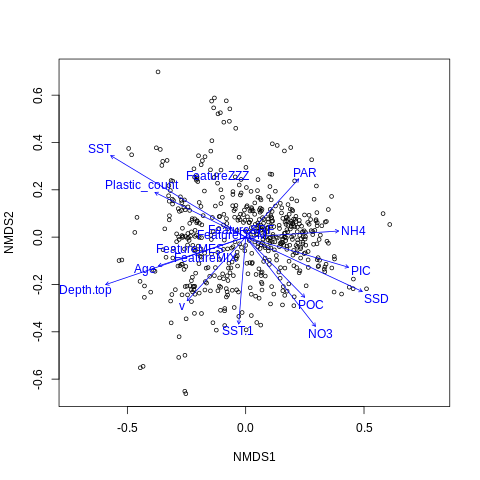

In [ ]:
%%R


plot(vare.mds, display = "sites")
plot(ef, p.max = 0.001)
# text(vare.mds, display = "species")


In [ ]:
%%R


#extract NMDS scores (x and y coordinates) for sites from newer versions of vegan package
data.scores = as.data.frame(scores(vare.mds)$sites)

#add 'season' column as before
data.scores$season = df_env$Feature

en_coord_cont = as.data.frame(scores(ef, "vectors")) * ordiArrowMul(ef)
en_coord_cat = as.data.frame(scores(ef, "factors")) * ordiArrowMul(ef)

gg = ggplot(data = data.scores, aes(x = NMDS1, y = NMDS2)) +
     geom_point(data = data.scores, aes(colour = Feature), size = 3, alpha = 0.5) +
     scale_colour_manual(values = c("orange", "steelblue"))  +
     geom_segment(aes(x = 0, y = 0, xend = NMDS1, yend = NMDS2),
       data = en_coord_cont, size =1, alpha = 0.5, colour = "grey30") +
     geom_point(data = en_coord_cat, aes(x = NMDS1, y = NMDS2),
       shape = "diamond", size = 4, alpha = 0.6, colour = "navy") +
     geom_text(data = en_coord_cat, aes(x = NMDS1, y = NMDS2+0.04),
       label = row.names(en_coord_cat), colour = "navy", fontface = "bold") +
     geom_text(data = en_coord_cont, aes(x = NMDS1, y = NMDS2), colour = "grey30",
       fontface = "bold", label = row.names(en_coord_cont)) +
     theme(axis.title = element_text(size = 10, face = "bold", colour = "grey30"),
       panel.background = element_blank(), panel.border = element_rect(fill = NA, colour = "grey30"),
       axis.ticks = element_blank(), axis.text = element_blank(), legend.key = element_blank(),
       legend.title = element_text(size = 10, face = "bold", colour = "grey30"),
       legend.text = element_text(size = 9, colour = "grey30")) +
     labs(colour = "Feature")

gg

R[write to console]: Error in FUN(X[[i]], ...) : object 'Feature' not found



RRuntimeError: ignored

In [ ]:
%%R

install.packages("devtools")
devtools::install_github("cran/mvpart")

R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

R[write to console]: also installing the dependencies ‘Rcpp’, ‘httpuv’, ‘xtable’, ‘fontawesome’, ‘sourcetools’, ‘later’, ‘promises’, ‘textshaping’, ‘shiny’, ‘downlit’, ‘ragg’, ‘htmlwidgets’, ‘miniUI’, ‘pkgdown’, ‘profvis’, ‘roxygen2’, ‘urlchecker’


R[write to console]: trying URL 'https://cran.rstudio.com/src/contrib/Rcpp_1.0.9.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 2957812 bytes (2.8 MB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to 

* checking for file ‘/tmp/Rtmp9SwYKR/remotesfe4eca5f33/cran-mvpart-acf0035/DESCRIPTION’ ... OK
* preparing ‘mvpart’:
* checking DESCRIPTION meta-information ... OK
* cleaning src
* checking for LF line-endings in source and make files and shell scripts
* checking for empty or unneeded directories
* building ‘mvpart_1.6-2.tar.gz’



R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
%%R

df_env_t = t(df_env)
df_env_t

Streaming output truncated to the last 5000 lines.
RT              " 0.000000"                          
Age             "120"                                
Lat_plastic     "-39.6"                              
Lon_plastic     " -77.0"                             
Plastic_count   "2.1332164"                          
                ERR3587058                           
Device          "High Volume Peristaltic Pump"       
Year            "2011"                               
Latitude        "-34.1610"                           
Longitude       " -73.0995"                          
Feature         "SRF"                                
Depth.top       "  3"                                
Sample.material "0.22-3"                             
Biome           "Coastal Biome"                      
Region          "South Pacific Ocean"                
Province        "Chile-Peru Current Coastal Province"
Season          "summer"                             
Season.period   "middle"       

In [ ]:
%%R
rownames(df_env_t)

 [1] "Device"          "Year"            "Latitude"        "Longitude"      
 [5] "Feature"         "Depth.top"       "Sample.material" "Biome"          
 [9] "Region"          "Province"        "Season"          "Season.period"  
[13] "SSD"             "PAR"             "SST"             "Fe"             
[17] "NH4"             "NO2"             "NO3"             "SSChla"         
[21] "Chl"             "Ssphi"           "POC"             "PIC"            
[25] "Bathy.depth"     "SST.1"           "SSM"             "u"              
[29] "v"               "OW"              "MLE"             "RT"             
[33] "Age"             "Lat_plastic"     "Lon_plastic"     "Plastic_count"  


In [ ]:
%%R

abundance <- df
environmental_variables <- df_env_t

formula <- abundance ~ Device + Year + Latitude + Longitude + Feature + Depth.top + Sample.material + Biome+Region + Province + Season + Season.period + SSD + PAR + SST + Fe + NH4 + NO2 + NO3 + SSChla + Chl + Ssphi + POC + PIC +Bathy.depth + SST.1 + SSM + u + v + OW + MLE + RT + Age + Lat_plastic + Lon_plastic + Plastic_count

# Set a new seed for random numbers to ensure results are reproducible
set.seed(1)

# See `?mvpart()` for argument details
mvpart_run1 <- mvpart(
  form = formula,
  data = environmental_variables,
  all.leaves = TRUE,  # annotate all nodes
  rsq = TRUE,  # give "rsq" plot
  pca = TRUE,  # plot PCA of group means and add species and site information
  wgt.ave.pca = TRUE  # plot weighted averages acorss sites for species

RParsingError: ignored

In [ ]:
str(mvpart_run1)


In [ ]:
summary(mvpart_run1)


In [ ]:
table(mvpart_run1$where)


In [ ]:
plot_where <- function(run) {
  run <- get(run)
  # Data
  index <- 1:600
  grouped_quadrats <- index %>%
    index.to.gxgy(plotdim = c(600, 400)) %>%
    as_tibble() %>%
    mutate(
      index = index,
      group = as.factor(run$where)
    )

  # Plot
  ggplot(grouped_quadrats, aes(gx, gy)) +
    geom_raster(aes(fill = group)) +
    geom_text(aes(label = index)) +
    theme_minimal()
}
plot_where("mvpart_run1")

### Model

In [ ]:
keep = Metatranscriptomic_env[Metatranscriptomic_env.Feature == "SRF"].index
keep

Index(['ERR1001626', 'ERR1001627', 'ERR1328122', 'ERR1328125', 'ERR1328126',
       'ERR1328127', 'ERR1336911', 'ERR1336912', 'ERR3562601', 'ERR3586678',
       ...
       'ERR3587192', 'ERR3587195', 'ERR3587197', 'ERR3587198', 'ERR3587199',
       'ERR3587200', 'ERR3587201', 'ERR3587202', 'ERR3587203', 'ERR3587204'],
      dtype='object', length=291)

In [ ]:
X = Metatranscriptomic_diamond_norm_counts.copy()
X = X.loc[keep]
# X = X.drop(["PEG", "PHA", "PHB"], axis=1)
X

,PHB,PHA,PHO,PCL,PVA,PU,PPL,P3HP,P4HB,PEA,...,PE,PBS-Blend,PBSA-Blend,P3HV,PBAT,PEF,PMCL,LDPE,PS,NR
ERR1001626,73.325913,134.245674,0.0,35.922291,0.370333,14.072650,0.185166,0.555499,0.555499,0.555499,...,2.221997,0.0,0.0,28.515633,33.515127,0.000000,0.0,19.997976,30.737630,0.740666
ERR1001627,12.278030,17.815181,0.0,6.018642,0.240746,16.129961,0.000000,0.000000,0.000000,0.000000,...,0.240746,0.0,0.0,4.092677,21.907858,0.000000,0.0,6.018642,13.241013,0.000000
ERR1328122,14.930205,20.902287,0.0,10.890267,0.351299,15.808452,0.000000,0.000000,0.000000,0.000000,...,0.351299,0.0,0.0,2.810391,18.618844,0.000000,0.0,2.459093,0.000000,0.878247
ERR1328125,16.090889,21.063583,0.0,8.115813,0.281473,12.244087,0.046912,0.187649,0.187649,0.187649,...,0.375298,0.0,0.0,3.236943,20.922846,0.000000,0.0,2.157962,0.000000,0.938244
ERR1328126,6.034605,9.097625,0.0,3.657337,0.731467,10.514843,0.000000,0.045717,0.045717,0.045717,...,0.000000,0.0,0.0,1.874385,16.595165,0.000000,0.0,0.594317,2.011535,0.045717
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR3587200,13.641812,15.554215,0.0,5.099743,0.212489,9.732009,0.000000,0.084996,0.084996,0.084996,...,3.612318,0.0,0.0,1.699914,17.934095,0.424979,0.0,3.739811,0.042498,0.084996
ERR3587201,13.802977,15.413324,0.0,1.610347,0.460099,12.422679,0.000000,0.460099,0.460099,0.460099,...,0.690149,0.0,0.0,1.380298,23.695110,0.000000,0.0,2.530546,0.460099,1.380298
ERR3587202,6.253687,7.742660,0.0,3.573535,0.000000,11.911784,0.000000,0.000000,0.000000,0.000000,...,2.382357,0.0,0.0,1.488973,8.933838,0.000000,0.0,1.488973,0.000000,1.191178
ERR3587203,6.631980,8.842639,0.0,5.895093,0.000000,12.035815,0.000000,0.000000,0.000000,0.000000,...,0.982515,0.0,0.0,1.228144,13.263959,0.245629,0.0,3.193175,0.000000,1.719402


In [ ]:
# y = Metatranscriptomic_env.Plastic_count
y = Metatranscriptomic_env.loc[keep].Plastic_count
y.head()


ERR1001626    3.449604
ERR1001627    2.993198
ERR1328122    3.896750
ERR1328125    3.896750
ERR1328126    3.896750
Name: Plastic_count, dtype: float64

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=10)

In [ ]:
from sklearn.linear_model import LinearRegression
lr_clf = LinearRegression()
lr_clf.fit(X_train,y_train)
lr_clf.score(X_test,y_test)

0.29920451276034665

In [ ]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score

cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)

cross_val_score(LinearRegression(), X, y, cv=cv)

array([0.32129317, 0.23131608, 0.27606531, 0.48876314, 0.30646951])

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier

def find_best_model_using_gridsearchcv(X,y):
    algos = {
        'linear_regression' : {
            'model': LinearRegression(),
            'params': {
                'normalize': [True, False]
            }
        },
        'lasso': {
            'model': Lasso(),
            'params': {
                'alpha': [1,2],
                'selection': ['random', 'cyclic']
            }
        },
        'decision_tree': {
            'model': DecisionTreeRegressor(),
            'params': {
                'criterion' : ['squared_error','friedman_mse'],
                'splitter': ['best','random']
            }
        }
    }
    scores = []
    cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
    for algo_name, config in algos.items():
        gs =  GridSearchCV(config['model'], config['params'], cv=cv, return_train_score=False, verbose=0)
        gs.fit(X,y)
        scores.append({
            'model': algo_name,
            'best_score': gs.best_score_,
            'best_params': gs.best_params_
        })

    return pd.DataFrame(scores,columns=['model','best_score','best_params'])

find_best_model_using_gridsearchcv(X,y)

,model,best_score,best_params
0,linear_regression,0.325473,{'normalize': True}
1,lasso,0.306894,"{'alpha': 1, 'selection': 'cyclic'}"
2,decision_tree,0.330153,"{'criterion': 'squared_error', 'splitter': 'ra..."


In [ ]:
import warnings
warnings.filterwarnings('ignore')

df = pd.DataFrame(columns=["model", "best_score", "best_params", "Feature", "Droped_plastics"])
import itertools

plastics = Metatranscriptomic_diamond_norm_counts.columns.to_list()
for L in range(0, len(plastics)+1):
  for subset in itertools.combinations(plastics, L):
    print(list(subset))
    try:
      X = X.drop(list(subset), axis=1)
      for feature in Metatranscriptomic_env.Feature.unique():

        keep = Metatranscriptomic_env[Metatranscriptomic_env.Feature == feature].index

        X = Metatranscriptomic_diamond_norm_counts.copy()
        X = X.loc[keep]

        y = Metatranscriptomic_env.loc[keep].Plastic_count

        tmp_df = find_best_model_using_gridsearchcv(X,y)
        tmp_df["Feature"] = feature
        tmp_df["Droped_plastics"] = str(list(subset))
        df = pd.concat([df, tmp_df])
    except:
      a = 0


df = df.sort_values("best_score", ascending=False)
df.to_csv(path+"Metatranscriptomic_model_scores.tsv", sep = "\t")
df

[]
['PHB']
['PHA']
['PHO']
['PCL']
['PVA']
['PU']
['PPL']
['P3HP']
['P4HB']
['PEA']
['PES']
['O-PVA']
['PBS']
['PLA']
['P(3HB-co-3MP)']
['PEG']
['PHBV']
['PHPV']
['Nylon']
['PBSA']
['PET']
['PE']
['PBS-Blend']
['PBSA-Blend']
['P3HV']
['PBAT']
['PEF']
['PMCL']
['LDPE']
['PS']
['NR']
['PHB', 'PHA']
['PHB', 'PHO']
['PHB', 'PCL']
['PHB', 'PVA']
['PHB', 'PU']
['PHB', 'PPL']
['PHB', 'P3HP']
['PHB', 'P4HB']
['PHB', 'PEA']
['PHB', 'PES']
['PHB', 'O-PVA']
['PHB', 'PBS']
['PHB', 'PLA']
['PHB', 'P(3HB-co-3MP)']
['PHB', 'PEG']
['PHB', 'PHBV']
['PHB', 'PHPV']
['PHB', 'Nylon']
['PHB', 'PBSA']
['PHB', 'PET']
['PHB', 'PE']
['PHB', 'PBS-Blend']
['PHB', 'PBSA-Blend']
['PHB', 'P3HV']
['PHB', 'PBAT']
['PHB', 'PEF']
['PHB', 'PMCL']
['PHB', 'LDPE']
['PHB', 'PS']
['PHB', 'NR']
['PHA', 'PHO']
['PHA', 'PCL']
['PHA', 'PVA']
['PHA', 'PU']
['PHA', 'PPL']
['PHA', 'P3HP']
['PHA', 'P4HB']
['PHA', 'PEA']
['PHA', 'PES']
['PHA', 'O-PVA']
['PHA', 'PBS']
['PHA', 'PLA']
['PHA', 'P(3HB-co-3MP)']
['PHA', 'PEG']
['PHA', 'PHB

In [ ]:
from sklearn.ensemble import RandomForestClassifier

from sklearn import preprocessing
from sklearn import utils

X = Metatranscriptomic_diamond_norm_counts.copy()
# X = X.loc[keep]
# X = X.drop(["PEG", "PHA", "PHB"], axis=1)

# y = Metatranscriptomic_env.loc[keep].Plastic_count
def round_to_5(n):
  return 5 * round(n/5, 1)
y = Metatranscriptomic_env.Plastic_count.apply(round_to_5).astype("string")
y


# #convert y values to categorical values
# lab = preprocessing.LabelEncoder()
# y_transformed = lab.fit_transform(y)

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=10)


for n_estimator in [10, 50, 100, 200, 300, 400, 500, 800, 1000]:
  model = RandomForestClassifier(n_estimators=n_estimator)
  model.fit(X_train, y_train)
  print(n_estimator, model.score(X_test, y_test))

10 0.7037037037037037
50 0.8055555555555556
100 0.7962962962962963
200 0.7870370370370371
300 0.7685185185185185
400 0.7592592592592593
500 0.7870370370370371
800 0.7685185185185185
1000 0.7870370370370371


In [ ]:
y_test.head(10)

ERR3586833    3.5
ERR3587062    4.0
ERR3587077    3.5
ERR3586928    4.0
ERR3586713    3.0
ERR3586974    3.5
ERR3586888    3.5
ERR3586690    2.5
ERR3586768    4.0
ERR3586998    1.5
Name: Plastic_count, dtype: string

In [ ]:
model.predict(X_test.iloc[0:10])
# X_test.iloc[0:1]

array(['4.0', '4.0', '3.5', '4.0', '3.0', '4.0', '3.5', '2.5', '4.0',
       '1.5'], dtype=object)

In [ ]:
from sklearn.metrics import confusion_matrix

y_predicted = model.predict(X_test)
cm = confusion_matrix(y_test, y_predicted)
cm

array([[ 1,  0,  0,  0,  0,  0,  2,  0,  0],
       [ 0,  5,  0,  0,  1,  0,  0,  0,  0],
       [ 0,  0,  1,  0,  3,  0,  1,  0,  0],
       [ 0,  0,  0,  3,  4,  1,  0,  0,  0],
       [ 0,  0,  0,  0, 21,  0,  1,  0,  0],
       [ 0,  0,  0,  0,  2, 16,  4,  0,  0],
       [ 0,  0,  0,  0,  2,  2, 28,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  9,  0],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  1]])

Text(69.0, 0.5, 'Truth')

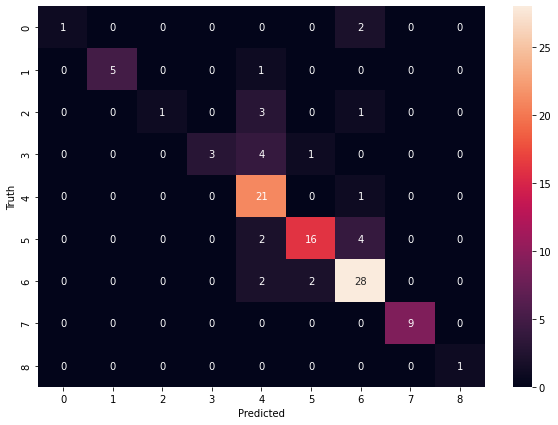

In [ ]:
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True)
plt.xlabel("Predicted")
plt.ylabel("Truth")

In [ ]:
y

ERR1001626    3.0
ERR1001627    3.0
ERR1328122    4.0
ERR1328123    4.0
ERR1328124    4.0
             ... 
ERR3587200    2.0
ERR3587201    2.0
ERR3587202    2.0
ERR3587203    2.0
ERR3587204    2.0
Name: Plastic_count, Length: 539, dtype: float64

In [ ]:
from sklearn.ensemble import RandomForestClassifier

from sklearn import preprocessing
from sklearn import utils

X = Metatranscriptomic_diamond_norm_counts.copy()
dummies = pd.get_dummies(Metatranscriptomic_env.Feature).drop("ZZZ", axis=1)
X = pd.concat([X, dummies], axis=1)

# X = X.loc[keep]
# X = X.drop(["PEG", "PHA", "PHB"], axis=1)

# y = Metatranscriptomic_env.loc[keep].Plastic_count
y = Metatranscriptomic_env.Plastic_count.round().astype("string")



# #convert y values to categorical values
# lab = preprocessing.LabelEncoder()
# y_transformed = lab.fit_transform(y)

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=10)


for n_estimator in [10, 50, 100, 200, 300, 400, 500, 800, 1000]:
  model = RandomForestClassifier(n_estimators=n_estimator)
  model.fit(X_train, y_train)
  print(n_estimator, model.score(X_test, y_test))

10 0.8055555555555556
50 0.8425925925925926
100 0.8703703703703703
200 0.8703703703703703
300 0.8703703703703703
400 0.8796296296296297
500 0.8796296296296297
800 0.8703703703703703
1000 0.8796296296296297


In [ ]:
from sklearn.ensemble import RandomForestClassifier

from sklearn import preprocessing
from sklearn import utils

X = Metatranscriptomic_diamond_norm_counts.copy()
dummies = pd.get_dummies(Metatranscriptomic_env.Feature).drop("ZZZ", axis=1)
X = pd.concat([X, dummies], axis=1)
X

,PHB,PHA,PHO,PCL,PVA,PU,PPL,P3HP,P4HB,PEA,...,PBAT,PEF,PMCL,LDPE,PS,NR,DCM,MES,MIX,SRF
ERR1001626,73.325913,134.245674,0.0,35.922291,0.370333,14.072650,0.185166,0.555499,0.555499,0.555499,...,33.515127,0.000000,0.0,19.997976,30.737630,0.740666,0,0,0,1
ERR1001627,12.278030,17.815181,0.0,6.018642,0.240746,16.129961,0.000000,0.000000,0.000000,0.000000,...,21.907858,0.000000,0.0,6.018642,13.241013,0.000000,0,0,0,1
ERR1328122,14.930205,20.902287,0.0,10.890267,0.351299,15.808452,0.000000,0.000000,0.000000,0.000000,...,18.618844,0.000000,0.0,2.459093,0.000000,0.878247,0,0,0,1
ERR1328123,8.448007,11.474655,0.0,5.288319,0.000000,9.379283,0.000000,0.000000,0.000000,0.000000,...,21.253057,0.000000,0.0,1.596474,0.000000,0.033260,1,0,0,0
ERR1328124,10.116983,12.093865,0.0,5.465497,0.000000,10.233270,0.000000,0.000000,0.000000,0.000000,...,22.792284,0.000000,0.0,1.162872,0.000000,0.000000,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERR3587200,13.641812,15.554215,0.0,5.099743,0.212489,9.732009,0.000000,0.084996,0.084996,0.084996,...,17.934095,0.424979,0.0,3.739811,0.042498,0.084996,0,0,0,1
ERR3587201,13.802977,15.413324,0.0,1.610347,0.460099,12.422679,0.000000,0.460099,0.460099,0.460099,...,23.695110,0.000000,0.0,2.530546,0.460099,1.380298,0,0,0,1
ERR3587202,6.253687,7.742660,0.0,3.573535,0.000000,11.911784,0.000000,0.000000,0.000000,0.000000,...,8.933838,0.000000,0.0,1.488973,0.000000,1.191178,0,0,0,1
ERR3587203,6.631980,8.842639,0.0,5.895093,0.000000,12.035815,0.000000,0.000000,0.000000,0.000000,...,13.263959,0.245629,0.0,3.193175,0.000000,1.719402,0,0,0,1


In [ ]:
Metatranscriptomic_env.columns

Index(['Device', 'Year', 'Latitude', 'Longitude', 'Feature', 'Depth top',
       'Sample material', 'Biome', 'Region', 'Province', 'Season',
       'Season period', 'SSD', 'PAR', 'SST', 'Fe', 'NH4', 'NO2', 'NO3',
       'SSChla', 'Chl', 'Ssphi', 'POC', 'PIC', 'Bathy depth', 'SST.1', 'SSM',
       'u', 'v', 'OW', 'MLE', 'RT', 'Age', 'Lat_plastic', 'Lon_plastic',
       'Plastic_count'],
      dtype='object')